In [1]:
import kahip
import networkx as nx
import matplotlib.pyplot as plt
import osmnx as ox
import pandas as pd
import utils
import numpy as np
import math
from shapely.geometry import Point, Polygon
import geopandas as gpd
from sklearn.linear_model import LinearRegression

In [2]:
#build adjacency array representation of the graph
xadj           = [0,2,5,7,9,12];
adjncy         = [1,4,0,2,4,1,3,2,4,0,1,3];
vwgt           = [1,1,1,1,1]
adjcwgt        = [2,1,2,1,1,1,1,1,1,1,1,1]
supress_output = 0
imbalance      = 0.03
nblocks        = 2 
seed           = 0

# set mode 
#const int FAST           = 0;
#const int ECO            = 1;
#const int STRONG         = 2;
#const int FASTSOCIAL     = 3;
#const int ECOSOCIAL      = 4;
#const int STRONGSOCIAL   = 5;
mode = 2 

blocks, edgecut = kahip.kaffpa(vwgt, xadj, adjcwgt, 
                              adjncy,  nblocks, imbalance, 
                              supress_output, seed, mode)

print(blocks)
print(edgecut)


2
[0, 0, 1, 1, 0]


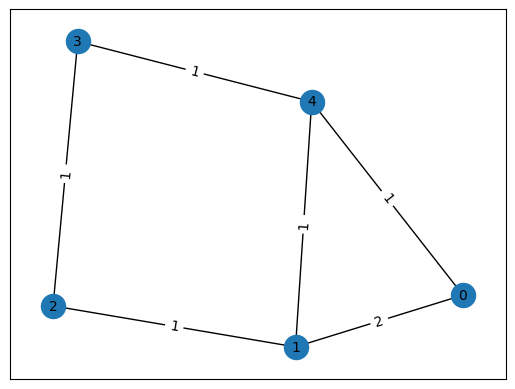

In [3]:
G_ = utils.kahip_to_nx(xadj, adjncy, vwgt, adjcwgt)
utils.display_graph(G_)

In [4]:
utils.nx_to_kahip(G_)

([1, 1, 1, 1, 1],
 [0, 2, 5, 7, 9, 12],
 [2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 [1, 4, 0, 2, 4, 1, 3, 2, 4, 0, 1, 3])

# Jouons maintenant avec OSMNX.


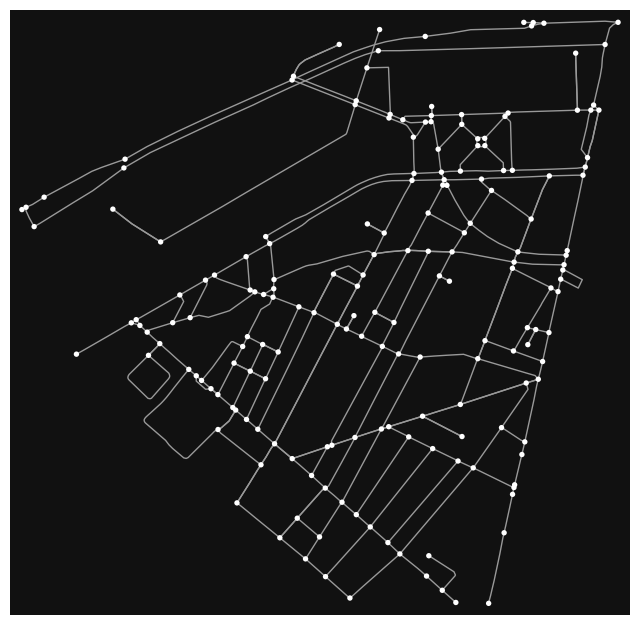

In [6]:
# download/model a street network for some city then visualize it
G = ox.graph_from_place("Epinettes, France", network_type="drive",simplify = True)
# Essayer avec "graph_from_adress"
fig, ax = ox.plot_graph(G)

In [51]:
G.remove_edges_from(nx.selfloop_edges(G))

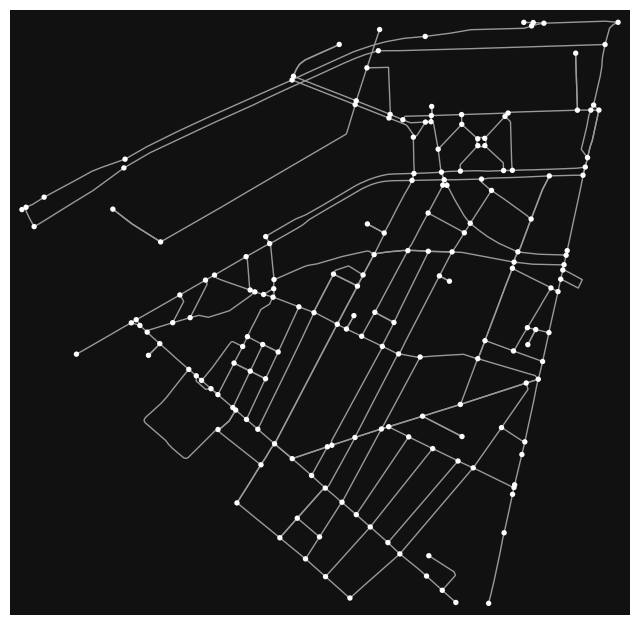

In [52]:
fig, ax = ox.plot_graph(G)

On voit que les selfloop ont été corectement supprimés.
Il paraît naturel de 
Il faut maintenant s'attaquer au problème des parallel edges.

In [53]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

In [54]:
# Ligne po
gdf_edges.loc[gdf_edges.index.get_level_values('key') == 0]

osmid  \
u          v          key                                                   
644129     6200752536 0                                           4039225   
           27323636   0                                         564197437   
           644130     0                                         564197753   
644130     178765864  0                                          17244047   
           2399756570 0                                         365263273   
...                                                                   ...   
7879515162 5222265998 0    [1085039784, 977481203, 912716053, 1085039783]   
7879515164 4692446096 0                                         905752681   
           7879515162 0                                          90654569   
7879515165 7879515164 0                                         844625786   
           7879515162 0                                         844625787   

                          lanes                 name      highway maxspeed  \
u          v          key                                                    
644129     6200752536 0       2       Rue Guy Môquet    secondary       30   
           27323636   0     NaN     Avenue de Clichy  residential       30   
           644130     0       2     Avenue de Clichy    secondary       30   
644130     178765864  0     NaN          Rue Pouchet     tertiary       30   
           2399756570 0       2         Rue Cardinet    secondary       30   
...                         ...                  ...          ...      ...   
7879515162 5222265998 0       1  Boulevard Bessières      primary       50   
7879515164 4692446096 0     NaN     Avenue de Clichy    secondary       30   
           7879515162 0     NaN     Avenue de Clichy    secondary       30   
7879515165 7879515164 0       2     Avenue de Clichy    secondary       30   
           7879515162 0       2   Boulevard Berthier      primary       30   

                           oneway  reversed   length  \
u          v          key                              
644129     6200752536 0     False     False   91.966   
           27323636   0      True     False   63.593   
           644130     0     False      True   57.046   
644130     178765864  0     False      True  334.257   
           2399756570 0     False      True   62.000   
...                           ...       ...      ...   
7879515162 5222265998 0      True     False  124.259   
7879515164 4692446096 0      True     False   24.528   
           7879515162 0      True     False   17.126   
7879515165 7879515164 0      True     False   22.256   
           7879515162 0      True     False   14.339   

                                                                    geometry  \
u          v          key                                                      
644129     6200752536 0    LINESTRING (2.31909 48.89124, 2.31921 48.89127...   
           27323636   0    LINESTRING (2.31909 48.89124, 2.31934 48.89110...   
           644130     0    LINESTRING (2.31909 48.89124, 2.31861 48.89150...   
644130     178765864  0    LINESTRING (2.31849 48.89157, 2.31856 48.89165...   
           2399756570 0    LINESTRING (2.31849 48.89157, 2.31837 48.89146...   
...                                                                      ...   
7879515162 5222265998 0    LINESTRING (2.31380 48.89433, 2.31396 48.89438...   
7879515164 4692446096 0      LINESTRING (2.31393 48.89420, 2.31418 48.89405)   
           7879515162 0    LINESTRING (2.31393 48.89420, 2.31390 48.89425...   
7879515165 7879515164 0    LINESTRING (2.31364 48.89426, 2.31384 48.89422...   
           7879515162 0    LINESTRING (2.31364 48.89426, 2.31368 48.89428...   

                          bridge width junction access  
u          v          key                               
644129     6200752536 0      NaN   NaN      NaN    NaN  
           27323636   0      NaN   NaN      NaN    NaN  
           644130     0      NaN   NaN      NaN    Na

In [7]:
Graphe_Paris = ox.graph_from_place("Paris, France", network_type="drive",simplify = True)

In [56]:
gdf_nodes_paris, gdf_edges_paris = ox.graph_to_gdfs(Graphe_Paris)

In [57]:
len(gdf_edges_paris.loc[gdf_edges_paris.index.get_level_values('key') == 1])/len(gdf_edges_paris)

0.0024879658175131158

On voit qu'à Paris, seulement 0.25% des voies sont des parallel edges.

Les ignorer et quand même lancer les algos dessus ?

In [58]:
gdf_edges_paris.index.get_level_values('key')

Index([0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       ...
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
      dtype='int64', name='key', length=18489)

In [59]:
parallel_edges_Paris = [(u,v) for u,v,key in Graphe_Paris.edges if key != 0]

In [60]:
Graphe_Paris.remove_edges_from(parallel_edges_Paris)

In [61]:
nx.get_edge_attributes(Graphe_Paris,'maxspeed')

{(125730, 268675130, 0): '30',
 (125730, 21112878, 0): '30',
 (125730, 244455548, 0): '30',
 (125730, 1089076182, 0): '30',
 (125742, 60912980, 0): '30',
 (125742, 206155932, 0): '30',
 (125742, 244455433, 0): '30',
 (125743, 244455500, 0): '30',
 (125745, 25245021, 0): '70',
 (125745, 125743, 0): '30',
 (125747, 125745, 0): '30',
 (125748, 84791125, 0): '30',
 (125760, 8220750778, 0): '30',
 (360930, 480690113, 0): '30',
 (360930, 361704, 0): '30',
 (360932, 253316556, 0): '30',
 (360932, 100289178, 0): '30',
 (360932, 252659093, 0): '30',
 (360932, 21657548, 0): '30',
 (360935, 246999158, 0): '30',
 (360935, 251514416, 0): '30',
 (360935, 246263427, 0): '30',
 (360935, 1829061660, 0): '30',
 (360935, 246998815, 0): '30',
 (360937, 360938, 0): '30',
 (360937, 921170521, 0): '30',
 (360937, 49889917, 0): '30',
 (360938, 246999320, 0): '30',
 (360938, 360937, 0): '30',
 (360938, 49889201, 0): '30',
 (360938, 100292096, 0): '30',
 (360946, 36598216, 0): '30',
 (360946, 36481290, 0): '30'

In [63]:
Graphe_Paris = ox.speed.add_edge_speeds(Graphe_Paris)
w = nx.get_edge_attributes(Graphe_Paris, 'speed_kph')
nx.set_edge_attributes(Graphe_Paris, w, 'weight')

w_nodes = {}
for node in list(Graphe_Paris.nodes):
    w_nodes[node] = 1 
nx.set_node_attributes(Graphe_Paris,w_nodes, 'weight')

# Obtenez une liste des nœuds triés par ordre croissant
sorted_nodes = sorted(Graphe_Paris.nodes())

# Créez un dictionnaire de correspondance entre les anciens nœuds et les nouveaux
mapping = {old_node: new_node for new_node, old_node in enumerate(sorted_nodes)}

Graphe_Paris = nx.relabel_nodes(Graphe_Paris, mapping)

In [64]:
nx.get_node_attributes(Graphe_Paris,'weight')

{0: 1,
 1: 1,
 2: 1,
 3: 1,
 4: 1,
 5: 1,
 6: 1,
 7: 1,
 8: 1,
 9: 1,
 10: 1,
 11: 1,
 12: 1,
 13: 1,
 14: 1,
 15: 1,
 16: 1,
 17: 1,
 18: 1,
 19: 1,
 20: 1,
 21: 1,
 22: 1,
 23: 1,
 24: 1,
 25: 1,
 26: 1,
 27: 1,
 28: 1,
 29: 1,
 30: 1,
 31: 1,
 32: 1,
 33: 1,
 34: 1,
 35: 1,
 36: 1,
 37: 1,
 38: 1,
 39: 1,
 40: 1,
 41: 1,
 42: 1,
 43: 1,
 44: 1,
 45: 1,
 46: 1,
 47: 1,
 48: 1,
 49: 1,
 50: 1,
 51: 1,
 52: 1,
 53: 1,
 54: 1,
 55: 1,
 56: 1,
 57: 1,
 58: 1,
 59: 1,
 60: 1,
 61: 1,
 62: 1,
 63: 1,
 64: 1,
 65: 1,
 66: 1,
 67: 1,
 68: 1,
 69: 1,
 70: 1,
 71: 1,
 72: 1,
 73: 1,
 74: 1,
 75: 1,
 76: 1,
 77: 1,
 78: 1,
 79: 1,
 80: 1,
 81: 1,
 82: 1,
 83: 1,
 84: 1,
 85: 1,
 86: 1,
 87: 1,
 88: 1,
 89: 1,
 90: 1,
 91: 1,
 92: 1,
 93: 1,
 94: 1,
 95: 1,
 96: 1,
 97: 1,
 98: 1,
 99: 1,
 100: 1,
 101: 1,
 102: 1,
 103: 1,
 104: 1,
 105: 1,
 106: 1,
 107: 1,
 108: 1,
 109: 1,
 110: 1,
 111: 1,
 112: 1,
 113: 1,
 114: 1,
 115: 1,
 116: 1,
 117: 1,
 118: 1,
 119: 1,
 120: 1,
 121: 1,
 122: 1,
 12

In [67]:
Graphe_Paris = ox.graph_from_place("Paris, France", network_type="drive",simplify = True)

In [71]:
kahip_graph = from_nx_to_kahip_key(Graphe_Paris)
a,b,c,d = kahip_graph[0], kahip_graph[1], kahip_graph[2], kahip_graph[3]

In [8]:
Paris = ox.graph_from_place("Paris, France", network_type="drive",simplify = True)

In [7]:
_ = ox.plot_graph(Paris)

NameError: name 'Paris' is not defined

In [91]:
kahip_Paris = from_nx_to_kahip_key(Paris)

In [93]:
coupe_Paris = aretes_coupees(kahip_Paris[1], kahip_Paris[2], kahip_Paris[3], blocks)

In [94]:
coupe_Paris 

[(61, 5167, 20),
 (63, 2624, 30),
 (128, 2339, 30),
 (129, 2624, 30),
 (176, 1530, 30),
 (190, 191, 30),
 (218, 7745, 30),
 (230, 3462, 30),
 (233, 550, 30),
 (238, 1541, 30),
 (293, 6420, 30),
 (546, 547, 30),
 (553, 8413, 30),
 (807, 2506, 30),
 (956, 985, 30),
 (972, 8236, 30),
 (986, 7743, 30),
 (989, 9322, 30),
 (1464, 1465, 30),
 (1534, 5943, 30),
 (1535, 9405, 30),
 (1653, 1899, 30),
 (1668, 8991, 70),
 (1831, 1833, 30),
 (1864, 5715, 70),
 (1889, 1893, 30),
 (1895, 9524, 30),
 (2072, 6670, 30),
 (2116, 2119, 30),
 (2313, 9260, 30),
 (2313, 9275, 30),
 (2314, 6274, 30),
 (2318, 2319, 30),
 (2336, 2337, 30),
 (2435, 6635, 50),
 (2471, 2472, 30),
 (2473, 6730, 50),
 (2488, 9484, 30),
 (2495, 2498, 30),
 (2589, 6584, 30),
 (2621, 7190, 70),
 (2622, 6122, 70),
 (2638, 2641, 30),
 (2640, 6661, 30),
 (5261, 9567, 30),
 (6321, 8260, 30),
 (6420, 8313, 30),
 (6855, 9545, 40),
 (6997, 8342, 50),
 (7830, 7838, 30),
 (8220, 8414, 30),
 (8853, 9427, 30),
 (9403, 9546, 30)]

In [95]:
coupe_Paris_bis = []
for coupe in coupe_Paris:
    coupe_Paris_bis.append((coupe[0],coupe[1],0))

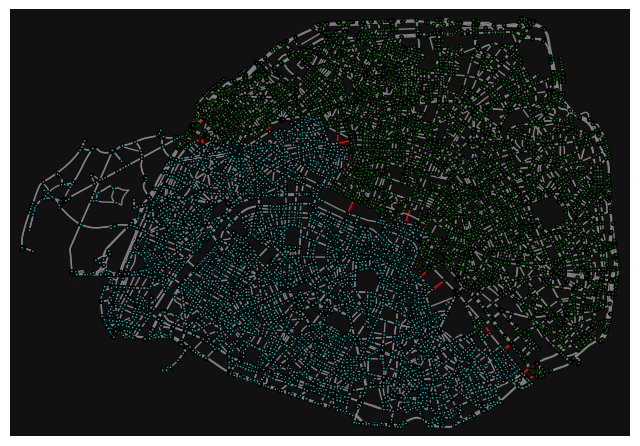

In [96]:
Paris = add_nodes_and_edges_weights_and_relabel(remove_parallel_and_self_loops(Paris))
# highlight all edge_cuts
ec = ["r" if (u,v,k) in coupe_Paris_bis or (v,u,k) in coupe_Paris_bis else "gray" for u,v,k in Paris.edges]
nc = ["c" if blocks[n] == 0 else "g" for n in Paris.nodes]
fig, ax = ox.plot_graph(
    Paris, node_color=nc, node_edgecolor="k", node_size=5, edge_color=ec, edge_linewidth=1
)

In [97]:
Paris.edges

OutMultiEdgeView([(0, 6524, 0), (0, 782, 0), (0, 5838, 0), (0, 7816, 0), (1, 3392, 0), (1, 5599, 0), (1, 5808, 0), (2, 5833, 0), (3, 1676, 0), (3, 2, 0), (4, 3, 0), (5, 3469, 0), (6, 9305, 0), (7, 7251, 0), (7, 71, 0), (8, 6116, 0), (8, 4217, 0), (8, 6094, 0), (8, 888, 0), (9, 5921, 0), (9, 6071, 0), (9, 5899, 0), (9, 8148, 0), (9, 5920, 0), (10, 11, 0), (10, 7693, 0), (10, 3342, 0), (11, 5923, 0), (11, 10, 0), (11, 3341, 0), (11, 4231, 0), (12, 3321, 0), (12, 3244, 0), (13, 4529, 0), (13, 3240, 0), (13, 3237, 0), (14, 3208, 0), (14, 3209, 0), (15, 8948, 0), (15, 8100, 0), (15, 6887, 0), (16, 4286, 0), (16, 4250, 0), (16, 4287, 0), (17, 4336, 0), (17, 4354, 0), (17, 4799, 0), (18, 4423, 0), (18, 4372, 0), (18, 4698, 0), (19, 5116, 0), (19, 3495, 0), (19, 3031, 0), (19, 2630, 0), (19, 5852, 0), (20, 2978, 0), (20, 521, 0), (20, 5119, 0), (21, 5701, 0), (21, 7757, 0), (22, 2992, 0), (22, 8926, 0), (23, 6421, 0), (23, 7150, 0), (24, 6705, 0), (24, 6703, 0), (24, 6702, 0), (24, 3008, 0), (

## Il faudrait écrire une pipeline inverse pour revenir au graphe de départ et récupérer l'info géographique sur les arêtes à couper

In [98]:
def add_nodes_and_edges_weights_and_relabel(G):
    
    G_ = ox.speed.add_edge_speeds(G)
    w = nx.get_edge_attributes(G_, 'speed_kph')
    nx.set_edge_attributes(G_, w, 'weight')

    w_nodes = {}
    for node in list(G_.nodes):
        w_nodes[node] = 1 
    nx.set_node_attributes(G_,w_nodes, 'weight')

    # Obtenez une liste des nœuds triés par ordre croissant
    sorted_nodes = sorted(G_.nodes())

    # Créez un dictionnaire de correspondance entre les anciens nœuds et les nouveaux
    mapping = {old_node: new_node for new_node, old_node in enumerate(sorted_nodes)}

    G_ = nx.relabel_nodes(G_, mapping)

    return G_

In [2]:
Paris_base = ox.graph_from_place("Paris, France", network_type="drive",simplify = True)

In [100]:
mes_modules.from_nx_to_aretes_coupees_base(Paris_base)

Rue de Provence
Rue Saint-Lazare
Place de l’Europe - Simone Veil
Rue d'Amsterdam
Quai de la Tournelle
Avenue du Général Lemonnier
Rue Alfred de Vigny
Pont de Tolbiac
Avenue de France
Rue Cuvier
['Place Henri Salvador', 'Boulevard des Capucines']
Quai de la Gare
Boulevard Vincent Auriol
Avenue Carnot
Rue du Faubourg Saint-Honoré
Avenue Mac-Mahon
Rue de Courcelles
Route de la Porte des Sablons à la Porte Maillot
Boulevard Saint-Germain
Rue du Cardinal Lemoine
Rue des Fossés Saint-Bernard
Rue du Renard
Boulevard Périphérique Extérieur
Rue Saint-Honoré
Boulevard Périphérique Intérieur
Rue de l'Amiral de Coligny
Boulevard de Sébastopol
Quai de l'Hôtel de Ville
Rue des Archives
Rue de Constantinople
Rue du Rocher
Rue de Miromesnil
Rue Andrieux
Place de l’Europe - Simone Veil
Boulevard Malesherbes
Place du Général Patton
Avenue de la Grande Armée
Avenue de Malakoff
Avenue de Wagram
Rue du Général Anselin
Boulevard Périphérique Extérieur
Boulevard Périphérique Intérieur
Rue Auber
Rue des Mathu

[(61, 5167, 0), (63, 2624, 0), (128, 2339, 0), (129, 2624, 0), (176, 1530, 0), (190, 191, 0), (218, 7745, 0), (230, 3462, 0), (233, 550, 0), (238, 1541, 0), (293, 6420, 0), (546, 547, 0), (553, 8413, 0), (807, 2506, 0), (956, 985, 0), (972, 8236, 0), (986, 7743, 0), (989, 9322, 0), (1464, 1465, 0), (1534, 5943, 0), (1535, 9405, 0), (1653, 1899, 0), (1668, 8991, 0), (1831, 1833, 0), (1864, 5715, 0), (1889, 1893, 0), (1895, 9524, 0), (2072, 6670, 0), (2116, 2119, 0), (2313, 9260, 0), (2313, 9275, 0), (2314, 6274, 0), (2318, 2319, 0), (2336, 2337, 0), (2435, 6635, 0), (2471, 2472, 0), (2473, 6730, 0), (2488, 9484, 0), (2495, 2498, 0), (2589, 6584, 0), (2621, 7190, 0), (2622, 6122, 0), (2638, 2641, 0), (2640, 6661, 0), (5261, 9567, 0), (6321, 8260, 0), (6420, 8313, 0), (6855, 9545, 0), (6997, 8342, 0), (7830, 7838, 0), (8220, 8414, 0), (8853, 9427, 0), (9403, 9546, 0)]
1810


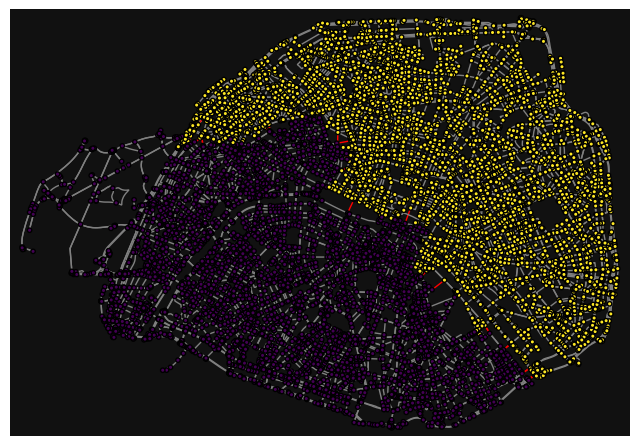

In [101]:
mes_modules.from_ox_to_coupe(Paris_base,2,0.1,0)

In [102]:
help(mes_modules)

Help on module mes_modules:

NAME
    mes_modules

FUNCTIONS
    add_nodes_and_edges_weights_and_relabel(G)
        # Fonction qui ajoute les attributs poids aux nodes et edges à un graphe osmnx et qui relabelle les noeuds de 0 à n
    
    aretes_coupees(xadj, adjcwgt, adjncy, comp_cnx)
        # Fonction qui, étant donnés un graphe kahip et la liste de ses composantes connexes après la coupe, retourne les arêtes coupées et le poids de la coupe
    
    clean_ox(G)
        # Prend en argument un graphe ox, relabelle les noeuds et ajoute les poids
    
    display_graph(graph)
        Display a graph using spring_layout and node labels
    
    from_kahip_to_nx(xadj, adjncy, vwgt, adjcwgt, display=False)
        # Fonction qui convertit un graphe kahip en graphe nx
    
    from_nx_to_aretes_coupees_base(G_base, nblocks=2, imbalance=0.1, seed=0, mode=0)
        # Fonction qui applique KaHIP au graphe et affiche le nom des arêtes coupees
    
    from_nx_to_kahip(G)
        # Fonction q

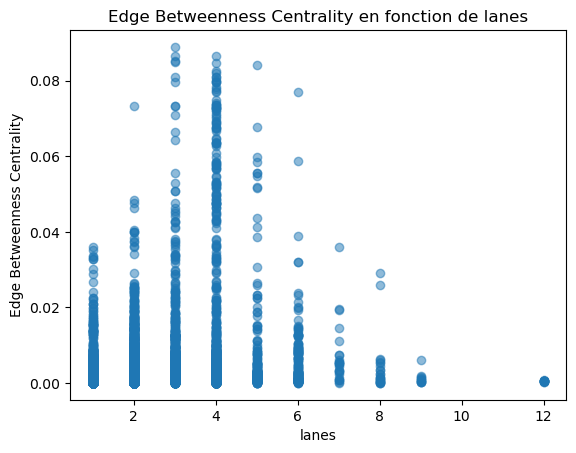

In [103]:
mes_modules.plot_betweenness(Paris_base,'lanes')

## On remarque que les edges à 4 voies ont en général une forte edge betweenness centrality

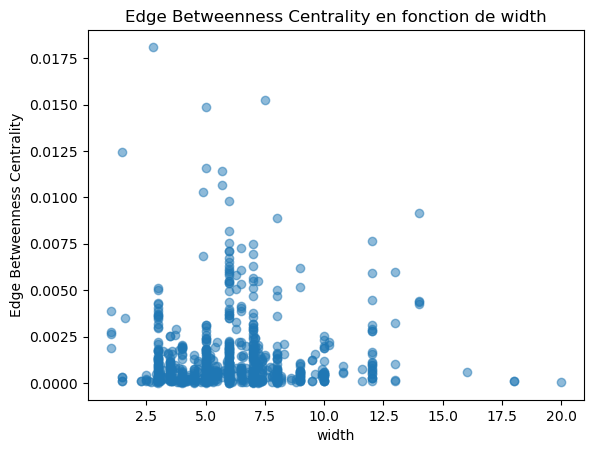

In [210]:
mes_modules.plot_betweenness(Paris_base,'width')

## On ne remarque pas de lien entre la largeur de la voie et l'edge betweenness centrality

In [ ]:
mes_modules.plot_betweenness(ox.graph_from_place('Islamabad, Pakistan', network_type = 'drive', simplify = True), 'lanes') 

In [ ]:
mes_modules.plot_betweenness(ox.graph_from_place('Marseille, France', network_type = 'drive', simplify = True) ,'lanes')

In [ ]:
mes_modules.from_ox_to_coupe(ox.graph_from_place('Shanghai, China', network_type = 'drive', simplify = True),2,0.1,0)

In [ ]:
G = ox.graph_from_place('Paris, Paris, France', network_type="drive", buffer_dist=350,simplify=False,retain_all=True,clean_periphery=False,truncate_by_edge=False)
G_Paris = ox.project_graph(G, to_crs='epsg:2154')
print('Just after importation, we have : ')
print(str(len(G.edges())) + ' edges')
print(str(len(G.nodes()))+ ' nodes')
G2 = ox.consolidate_intersections(G_Paris, rebuild_graph=True, tolerance=2, dead_ends=True)
print('After consolidation, we have : ')
print(str(len(G2.edges())) + ' edges')
print(str(len(G2.nodes()))+ ' nodes')


In [ ]:
ox.plot_graph(G2,node_size=3)

In [ ]:
edge_betweenness = nx.edge_betweenness_centrality(Paris_base)

In [ ]:
num_attribute_values = []

# Récupération du nombre de voies pour chaque arête
attribute_data = ox.graph_to_gdfs(Paris_base, nodes=False)[['lanes', 'geometry']]

# Traiter les cas où l'attribut est une liste
for lanes, geometry in attribute_data.itertuples(index=False):
    # Si le nombre de voies est une liste, prenez la valeur maximale
    if isinstance(lanes, list):
        num_attribute_values.append(max(map(float, lanes)))
    elif not np.nan is lanes:
        num_attribute_values.append(float(lanes))
    else :
        num_attribute_values.append(0)

# Création d'une liste de tuples (edge_betweenness, nombre_de_voies)
data = [(edge_betweenness[edge], num_attribute) for edge, num_attribute in zip(edge_betweenness, num_attribute_values)]

# On ne garde que les edges pour lesquels l'attribut choisi est renseigné
data = [edge_attribute for edge_attribute in data if edge_attribute[1] != 0]

# Séparation des données en deux listes pour le tracé
centrality_values, num_attribute_values = zip(*data)

In [ ]:
np.corrcoef(centrality_values, num_attribute_values)

Faible corrélation entre le nombre de voies et l'edge betweenness centrality et entre la largeur de la voie

In [ ]:
Paris_base = ox.graph_from_place('Paris, Paris, France', network_type="drive",simplify = True)
New_York_base = ox.graph_from_place('New York, New York, USA', network_type="drive",simplify = True)
Shanghai_base = ox.graph_from_place('Shanghai, China', network_type="drive",simplify = True)
Dortmund_base = ox.graph_from_place('Dortmund, Allemagne', network_type="drive",simplify = True)
Volgograd_base = ox.graph_from_place('Volgograd, Russie', network_type="drive",simplify = True)
Venise_base = ox.graph_from_place('Venise, Italie', network_type="drive",simplify = True)
Canberra_base = ox.graph_from_place('Sydney, Australia', network_type="drive",simplify = True)
Le_Caire_base = ox.graph_from_place('Le Caire, Egypte', network_type="drive",simplify = True)

In [ ]:
mes_modules.from_ox_to_coupe(New_York_base,2,0.1,0)

In [ ]:
mes_modules.from_ox_to_coupe(Shanghai_base,2,0.1,0)

In [ ]:
mes_modules.from_ox_to_coupe(Dortmund_base,2,0.1,0)

In [ ]:
mes_modules.from_ox_to_coupe(Volgograd_base,2,0.1,0)

In [ ]:
mes_modules.from_ox_to_coupe(Venise_base,2,0.1,0)

In [ ]:
mes_modules.from_ox_to_coupe(Canberra_base,2,0.1,0)

In [ ]:
mes_modules.from_ox_to_coupe(Le_Caire_base,2,0.1,0)

In [ ]:
Bordeaux_base = ox.graph_from_place('Bordeaux, France', network_type="drive",simplify = True)

In [ ]:
mes_modules.from_ox_to_coupe(Bordeaux_base,2,0.1,0)

In [ ]:
Bruges_base = ox.graph_from_place('Bruges, Belgique', network_type="drive",simplify = True)

In [ ]:
mes_modules.from_ox_to_coupe(Bruges_base,2,0.1,0)

In [ ]:
Lubeck_base = ox.graph_from_place('Lubeck, Allemagne', network_type="drive",simplify = True)

In [ ]:
mes_modules.from_ox_to_coupe(Lubeck_base,2,0.1,0)

In [ ]:
Marseille_base = ox.graph_from_place('Marseille, France', network_type="drive",simplify = True)

In [ ]:
Cologne_base = ox.graph_from_place('Cologne, Allemagne', network_type="drive",simplify = True)

In [ ]:
mes_modules.from_ox_to_coupe(Marseille_base,2,0.1,0)

In [ ]:
mes_modules.from_ox_to_coupe(Cologne_base,2,0.01,0)

In [ ]:
Bombay_base = ox.graph_from_place('Bombay, Inde', network_type="drive",simplify = True)

In [ ]:
mes_modules.from_ox_to_coupe(Bombay_base,2,0.1,0)

In [ ]:
Sidney_base = Canberra_base

In [ ]:
liste_ville = [Paris_base, New_York_base, Shanghai_base, Dortmund_base, Volgograd_base, Venise_base, Sidney_base, Le_Caire_base, Bordeaux_base, Cologne_base, Bombay_base, Lubeck_base, Marseille_base]

In [ ]:
areas

In [ ]:
for i in range(0,len(liste_ville)):
    ox.save_graphml(liste_ville[i], filepath=f'{i}.graphml')

In [106]:
Plan_Hippodamien = ['Athens', 'Rhodes, Greece']
Ville_Rue = ['Champs-Elysees, Paris, France', 'Ginza, Tokyo']
Grille = ['Manhattan, New York', 'Chicago, USA', 'Barcelone, Espagne', 'Calgary, Canada']
Radiale = ['Washington, D.C., USA', 'Rome, Italie']
Ville_Ancienne = ['Jérusalem, Israël', 'Fez, Maroc', 'Gion, Kyoto']
Maillage_Irregulier = ['Napoli, Italie', 'Barri Gotic, Barcelone', 'Le Marais, Paris', 'Gamla Stan, Stockholm']
Etoile = ['Bruxelles, Belgique', 'Varsovie, Pologne', 'Milan, Italie']

In [ ]:
for ville in Grille:
    print(ville)
    G = ox.graph_from_place(ville, simplify = True, network_type = 'drive')
    print(f'La ville de {ville} a correctement été chargée')
    ox.save_graphml(G,filepath=f'{ville.replace(", ","_").replace(" ","_")}.graphml')
for ville in Radiale:
    print(ville)
    G = ox.graph_from_place(ville, simplify = True, network_type = 'drive')
    print(f'La ville de {ville} a correctement été chargée')
    ox.save_graphml(G,filepath=f'{ville.replace(", ","_").replace(" ","_")}.graphml')
for ville in Ville_Ancienne:
    print(ville)
    G = ox.graph_from_place(ville, simplify = True, network_type = 'drive')
    print(f'La ville de {ville} a correctement été chargée')
    ox.save_graphml(G,filepath=f'{ville.replace(", ","_").replace(" ","_")}.graphml')
for ville in Maillage_Irregulier:
    print(ville)
    G = ox.graph_from_place(ville, simplify = True, network_type = 'drive')
    print(f'La ville de {ville} a correctement été chargée')
    ox.save_graphml(G,filepath=f'{ville.replace(", ","_").replace(" ","_")}.graphml')
for ville in Etoile:
    print(ville)
    G = ox.graph_from_place(ville, simplify = True, network_type = 'drive')
    print(f'La ville de {ville} a correctement été chargée')
    ox.save_graphml(G,filepath=f'{ville.replace(", ","_").replace(" ","_")}.graphml')

In [ ]:
areas_grille = []
for ville in Grille:
    gdf = ox.geocode_to_gdf(ville)
    gdf = ox.project_gdf(gdf)
    areas_grille.append(gdf.area.iloc[0])
areas_hippodamien = []
for ville in Plan_Hippodamien:
    gdf = ox.geocode_to_gdf(ville)
    gdf = ox.project_gdf(gdf)
    areas_hippodamien.append(gdf.area.iloc[0])
areas_etoile = []
for ville in Etoile:
    gdf = ox.geocode_to_gdf(ville)
    gdf = ox.project_gdf(gdf)
    areas_etoile.append(gdf.area.iloc[0])
areas_ville_rue= []
for ville in Ville_Rue:
    gdf = ox.geocode_to_gdf(ville)
    gdf = ox.project_gdf(gdf)
    areas_ville_rue.append(gdf.area.iloc[0])
areas_maillage_irregulier = []
for ville in Maillage_Irregulier:
    gdf = ox.geocode_to_gdf(ville)
    gdf = ox.project_gdf(gdf)
    areas_maillage_irregulier.append(gdf.area.iloc[0])
areas_ville_ancienne = []
for ville in Ville_Ancienne:
    gdf = ox.geocode_to_gdf(ville)
    gdf = ox.project_gdf(gdf)
    areas_ville_ancienne.append(gdf.area.iloc[0])
areas_radiale = []
for ville in Radiale:
    gdf = ox.geocode_to_gdf(ville)
    gdf = ox.project_gdf(gdf)
    areas_radiale.append(gdf.area.iloc[0])

In [ ]:
areas_radiale

In [119]:
dictionnaire_urbanisme = {
    'Plan_Hippodamien': ['Athens', 'Rhodes, Greece'],
    'Ville_Rue': ['Champs-Elysees, Paris, France', 'Ginza, Tokyo'],
    'Grille': ['Manhattan, New York', 'Chicago, USA', 'Barcelone, Espagne', 'Calgary, Canada'],
    'Radiale': ['Washington, D.C., USA', 'Rome, Italie'],
    'Ville_Ancienne': ['Jérusalem, Israël', 'Fez, Maroc', 'Gion, Kyoto'],
    'Maillage_Irregulier': ['Napoli, Italie', 'Barri Gotic, Barcelone', 'Le Marais, Paris', 'Gamla Stan, Stockholm'],
    'Etoile': ['Bruxelles, Belgique', 'Varsovie, Pologne', 'Milan, Italie']
}

In [133]:
result = []
for key in dictionnaire_urbanisme.keys():
    for ville in dictionnaire_urbanisme[key]:
        G = ox.load_graphml(filepath = f'{ville.replace(", ","_").replace(" ","_")}.graphml')
        kahip_G = mes_modules.from_nx_to_kahip(G)
        edge_cut = (kahip.kaffpa(kahip_G[0],kahip_G[1],kahip_G[2],kahip_G[3],2,0.1,0,0,0))[0]
        gdf = ox.geocode_to_gdf(ville)
        gdf = ox.project_gdf(gdf)
        aire = gdf.area.iloc[0]/1000000
        result.append((key,edge_cut/aire))
        

In [136]:
values

(3.16729124713537,
 0.4035200062116191,
 131.57181412192472,
 486.4239134584497,
 10.418539604606181,
 2.2903685552350566,
 20.193411493374427,
 3.5900058387387674,
 8.780664170081874,
 3.0848795704132517,
 15.8371277949864,
 9.047676059433053,
 329.4100643602127,
 8.696964814351812,
 191.28030204118005,
 131.16123879725865,
 163.82165758212096,
 8.772961739095765,
 4.3828932291278,
 9.03961935535521)

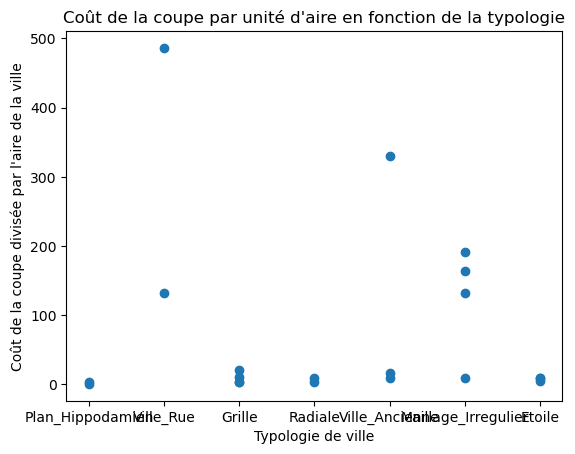

In [135]:
keys, values = zip(*result)

plt.scatter(keys, values)
plt.xlabel("Typologie de ville")
plt.ylabel("Coût de la coupe divisée par l\'aire de la ville")
plt.title("Coût de la coupe par unité d'aire en fonction de la typologie")

plt.show()

Résultats peu probants...

In [240]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(Paris_base)

In [241]:
# Nombre de voies dans Paris ayant une width renseignée
len(gdf_edges.loc[~gdf_edges['width'].isna()])

770

In [242]:
# Pourcentage de voies dans Paris ayant une width ayant une width renseignée:
len(gdf_edges.loc[~gdf_edges['width'].isna()])/len(gdf_edges)

0.041788776728535766

### Seules 4,2% des voies à Paris ont une largeur renseignée

In [243]:
# Nombre de voies dans Paris ayant un nombre de voies renseigné
len(gdf_edges.loc[~gdf_edges['lanes'].isna()])

8215

In [244]:
# Pourcentage de voies dans Paris ayant une width ayant une width renseignée:
len(gdf_edges.loc[~gdf_edges['lanes'].isna()])/len(gdf_edges)

0.445837403668729

### 45% des voies à Paris ont un nombre de voies renseigné

In [245]:
def replace_list_with_max(value):
    if isinstance(value, list):
        return float(max(map(float, value)))
    try:
        return float(value)
    except:
        return 0

In [246]:
gdf_voies_et_width = gdf_edges.loc[(~gdf_edges['lanes'].isna()) & (~gdf_edges['width'].isna())]

gdf_voies_et_width['width'] = gdf_voies_et_width['width'].apply(replace_list_with_max)
gdf_voies_et_width['lanes'] = gdf_voies_et_width['lanes'].apply(replace_list_with_max)

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


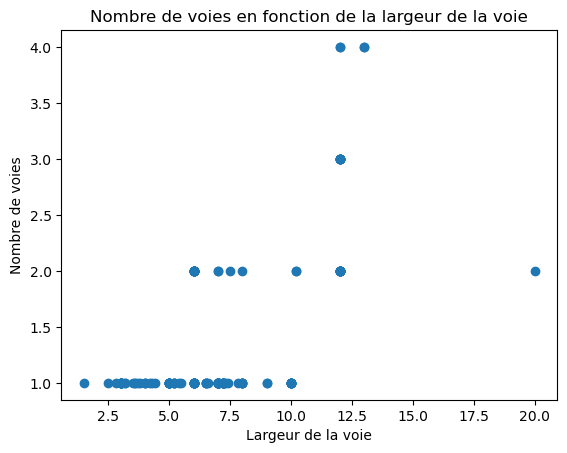

In [247]:
plt.scatter(gdf_voies_et_width['width'],gdf_voies_et_width['lanes'])
plt.xlabel("Largeur de la voie")
plt.ylabel("Nombre de voies")
plt.title("Nombre de voies en fonction de la largeur de la voie")
plt.show()

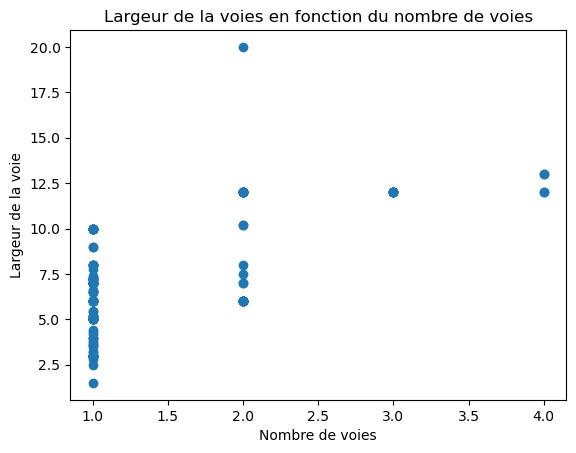

In [249]:
plt.scatter(gdf_voies_et_width['lanes'],gdf_voies_et_width['width'])
plt.xlabel("Nombre de voies")
plt.ylabel("Largeur de la voie")
plt.title("Largeur de la voies en fonction du nombre de voies")
plt.show()

In [250]:
model = LinearRegression()

In [251]:
x = np.array(gdf_voies_et_width['lanes'])
x = x.reshape(-1,1)

In [252]:
model.fit(x,gdf_voies_et_width['width'])

LinearRegression()

In [253]:
largeur_pred = model.predict(x)

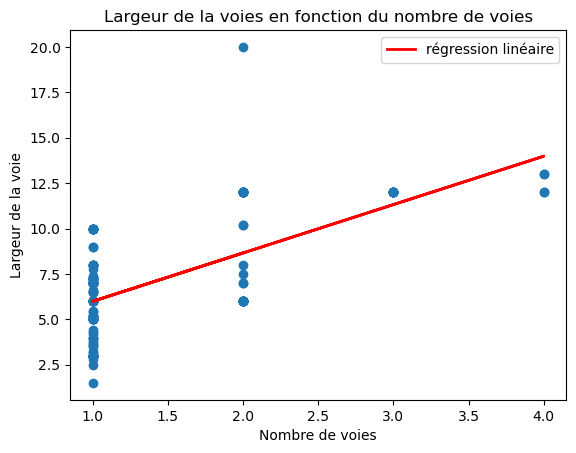

In [254]:
plt.scatter(gdf_voies_et_width['lanes'],gdf_voies_et_width['width'])
plt.plot(x,largeur_pred,linewidth=2,color='r', label='régression linéaire')
plt.legend()
plt.xlabel("Nombre de voies")
plt.ylabel("Largeur de la voie")
plt.title("Largeur de la voies en fonction du nombre de voies")
plt.show()

### Au passage, on n'obtient rien de très intéressant avec maxspeed

In [212]:
Bruxelles_base = ox.load_graphml(filepath='Bruxelles_Belgique.graphml')

In [213]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(Bruxelles_base)

In [214]:
# Nombre de voies dans Bruxelles ayant un nombre de voies renseigné
len(gdf_edges.loc[~gdf_edges['lanes'].isna()])

1203

In [216]:
# Proportion de voies dans Bruxelles ayant un nombre de voies renseigné
len(gdf_edges.loc[~gdf_edges['lanes'].isna()])/len(gdf_edges)

0.271190261496844

In [219]:
# Nombre de voies dans Bruxelles ayant une largeur de voie renseignée
len(gdf_edges.loc[~gdf_edges['width'].isna()])

44

In [220]:
# Proportion de voies dans Bruxelles ayant une largeur renseignée
len(gdf_edges.loc[~gdf_edges['width'].isna()])/len(gdf_edges)

0.009918845807033363

In [221]:
nx.get_edge_attributes(Paris_base,'lanes')

{(125730, 21112878, 0): '2',
 (125730, 244455548, 0): '2',
 (125730, 1089076182, 0): '2',
 (125742, 206155932, 0): '2',
 (125742, 244455433, 0): '2',
 (125743, 244455500, 0): '6',
 (125745, 125743, 0): '6',
 (125747, 125745, 0): '6',
 (125748, 84791125, 0): '6',
 (125760, 8220750778, 0): '2',
 (360930, 480690113, 0): '3',
 (360930, 361704, 0): '3',
 (360932, 253316556, 0): '2',
 (360932, 100289178, 0): '3',
 (360932, 252659093, 0): '5',
 (360932, 21657548, 0): '4',
 (360935, 246999158, 0): '2',
 (360935, 246263427, 0): '2',
 (360935, 1829061660, 0): '2',
 (360935, 246998815, 0): '3',
 (360937, 360938, 0): '3',
 (360937, 921170521, 0): '1',
 (360937, 49889917, 0): '2',
 (360938, 246999320, 0): '2',
 (360938, 360937, 0): '3',
 (360938, 49889201, 0): '2',
 (360938, 100292096, 0): '3',
 (360946, 36481290, 0): '1',
 (360977, 125385881, 0): '2',
 (360977, 36480662, 0): '1',
 (360978, 36476946, 0): '1',
 (360980, 5700619789, 0): '2',
 (360980, 1762423633, 0): '3',
 (360980, 322690568, 0): '1'

In [287]:
def reg_lin(G):
    gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)
    gdf_lanes_and_width = gdf_edges.loc[(~gdf_edges['width'].isna()) & (~gdf_edges['lanes'].isna())]
    gdf_lanes_and_width['width'] = gdf_lanes_and_width['width'].apply(replace_list_with_max)
    gdf_lanes_and_width['lanes'] = gdf_lanes_and_width['lanes'].apply(replace_list_with_max)
    x = np.array(gdf_lanes_and_width['lanes'])
    x = x.reshape(-1,1)
    y = gdf_lanes_and_width['width']
    model = LinearRegression()
    model.fit(x,y)
    return model

In [288]:
def add_extrapolated_width(G):
    model = reg_lin(G)
    dict_lanes = nx.get_edge_attributes(G, 'lanes')
    dict_width = nx.get_edge_attributes(G, 'width')
    for edge in dict_lanes.keys():
        dict_lanes[edge] = replace_list_with_max(dict_lanes[edge])
    moy_width = np.mean(list(dict_lanes.values()))
    for edge in G.edges:
        if edge not in dict_width.keys():
            if edge in dict_lanes.keys():
                dict_width[edge] = model.predict([[dict_lanes[edge]]])[0]
            else:
                dict_width[edge] = moy_width
    G_ = G
    nx.set_edge_attributes(G_, dict_width, 'width')
    return G_
    

In [289]:
model_Paris = reg_lin(Paris_base)

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [290]:
Paris_extra_width = add_extrapolated_width(Paris_base)

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [291]:
nx.get_edge_attributes(Paris_extra_width,'width')

{(125730, 268675130, 0): 2.4495435179549605,
 (125730, 21112878, 0): 8.656754819752024,
 (125730, 244455548, 0): 8.656754819752024,
 (125730, 1089076182, 0): 8.656754819752024,
 (125742, 60912980, 0): 2.4495435179549605,
 (125742, 206155932, 0): 8.656754819752024,
 (125742, 244455433, 0): 8.656754819752024,
 (125743, 244455500, 0): 19.309199455314268,
 (125745, 25245021, 0): 2.4495435179549605,
 (125745, 125743, 0): 19.309199455314268,
 (125747, 125745, 0): 19.309199455314268,
 (125748, 84791125, 0): 19.309199455314268,
 (125760, 8220750778, 0): 8.656754819752024,
 (360930, 480690113, 0): 11.319865978642586,
 (360930, 361704, 0): 11.319865978642586,
 (360932, 253316556, 0): 8.656754819752024,
 (360932, 100289178, 0): 11.319865978642586,
 (360932, 252659093, 0): 16.646088296423706,
 (360932, 21657548, 0): 13.982977137533146,
 (360935, 246999158, 0): 8.656754819752024,
 (360935, 251514416, 0): 2.4495435179549605,
 (360935, 246263427, 0): 8.656754819752024,
 (360935, 1829061660, 0): '10.2

In [270]:
np.mean(list(dict.values()))

2.0

In [4]:
edge_betweenness_Paris = nx.edge_betweenness_centrality(Paris_base)

In [5]:
edge_betweenness_Paris

{(125730, 268675130, 0): 0.00021365818858927485,
 (125730, 21112878, 0): 0.005554188631961207,
 (125730, 244455548, 0): 0.0014209398947518177,
 (125730, 1089076182, 0): 0.00026161474267771015,
 (125742, 60912980, 0): 0.0022252177760174203,
 (125742, 206155932, 0): 0.0008355324263437271,
 (125742, 244455433, 0): 0.0010344008753519402,
 (125743, 244455500, 0): 0.012445685357525342,
 (125745, 25245021, 0): 0.004006738123726511,
 (125745, 125743, 0): 0.006197237602676488,
 (125747, 125745, 0): 0.01020443131318873,
 (125748, 84791125, 0): 0.009551798753201399,
 (125760, 8220750778, 0): 0.0005143357866826385,
 (360930, 480690113, 0): 0.000880119684869725,
 (360930, 361704, 0): 0.001065135797685076,
 (360932, 253316556, 0): 0.0025098916707811257,
 (360932, 100289178, 0): 0.003467652446817066,
 (360932, 252659093, 0): 0.0032857682057754016,
 (360932, 21657548, 0): 0.0005544617580131059,
 (360935, 246999158, 0): 0.00018636159130802654,
 (360935, 251514416, 0): 0.0009803584286322204,
 (360935, 2

In [7]:
print(edge_betweenness_Paris)

{(125730, 268675130, 0): 0.00021365818858927485, (125730, 21112878, 0): 0.005554188631961207, (125730, 244455548, 0): 0.0014209398947518177, (125730, 1089076182, 0): 0.00026161474267771015, (125742, 60912980, 0): 0.0022252177760174203, (125742, 206155932, 0): 0.0008355324263437271, (125742, 244455433, 0): 0.0010344008753519402, (125743, 244455500, 0): 0.012445685357525342, (125745, 25245021, 0): 0.004006738123726511, (125745, 125743, 0): 0.006197237602676488, (125747, 125745, 0): 0.01020443131318873, (125748, 84791125, 0): 0.009551798753201399, (125760, 8220750778, 0): 0.0005143357866826385, (360930, 480690113, 0): 0.000880119684869725, (360930, 361704, 0): 0.001065135797685076, (360932, 253316556, 0): 0.0025098916707811257, (360932, 100289178, 0): 0.003467652446817066, (360932, 252659093, 0): 0.0032857682057754016, (360932, 21657548, 0): 0.0005544617580131059, (360935, 246999158, 0): 0.00018636159130802654, (360935, 251514416, 0): 0.0009803584286322204, (360935, 246263427, 0): 0.00119

In [2]:
mes_modules.betweenness_Paris()

{(125730, 268675130, 0): 0.00021365818858927485,
 (125730, 21112878, 0): 0.005554188631961207,
 (125730, 244455548, 0): 0.0014209398947518177,
 (125730, 1089076182, 0): 0.00026161474267771015,
 (125742, 60912980, 0): 0.0022252177760174203,
 (125742, 206155932, 0): 0.0008355324263437271,
 (125742, 244455433, 0): 0.0010344008753519402,
 (125743, 244455500, 0): 0.012445685357525342,
 (125745, 25245021, 0): 0.004006738123726511,
 (125745, 125743, 0): 0.006197237602676488,
 (125747, 125745, 0): 0.01020443131318873,
 (125748, 84791125, 0): 0.009551798753201399,
 (125760, 8220750778, 0): 0.0005143357866826385,
 (360930, 480690113, 0): 0.000880119684869725,
 (360930, 361704, 0): 0.001065135797685076,
 (360932, 253316556, 0): 0.0025098916707811257,
 (360932, 100289178, 0): 0.003467652446817066,
 (360932, 252659093, 0): 0.0032857682057754016,
 (360932, 21657548, 0): 0.0005544617580131059,
 (360935, 246999158, 0): 0.00018636159130802654,
 (360935, 251514416, 0): 0.0009803584286322204,
 (360935, 2

In [2]:
Paris_base = ox.graph_from_place("Paris, France", network_type="drive",simplify = True)

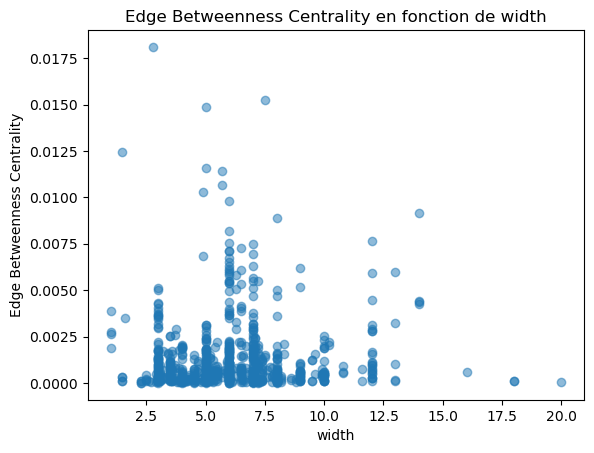

In [3]:
mes_modules.plot_betweenness_Paris(Paris_base,'width')

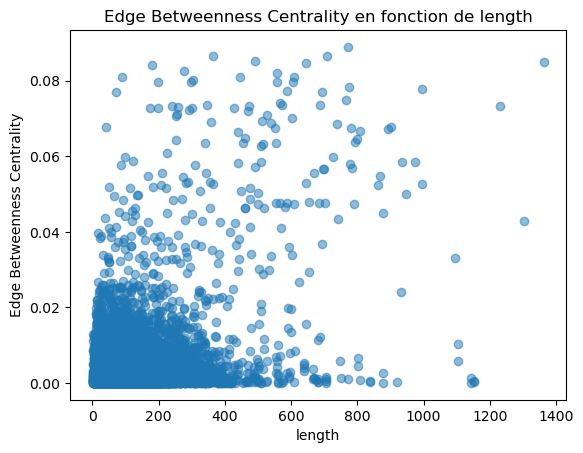

In [4]:
mes_modules.plot_betweenness_Paris(Paris_base,'length')

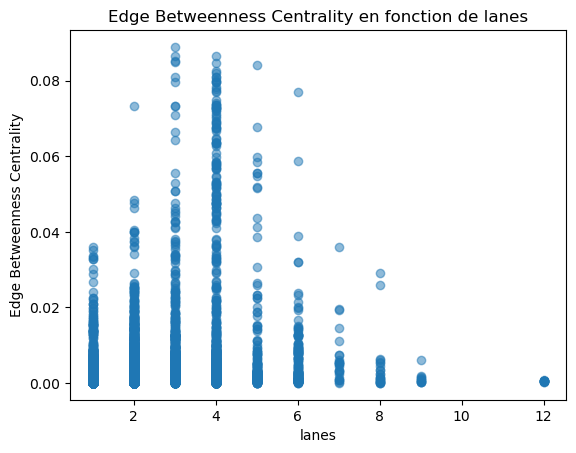

In [5]:
mes_modules.plot_betweenness_Paris(Paris_base,'lanes')

In [22]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(Paris_base)

In [23]:
gdf_edges

osmid                 name  \
u           v           key                                                 
125730      268675130   0                  315818975  Rue Henri Duvernois   
            21112878    0                   31093720    Rue Louis Lumière   
            244455548   0                   85735969    Rue Louis Lumière   
            1089076182  0     [266463585, 611974677]      Rue Louis Ganne   
125742      60912980    0                    4039102      Rue de Buzenval   
...                                              ...                  ...   
11486390934 1659448482  0                 1236876878      Boulevard Soult   
11486390939 1659448493  0                 1236876876   Cours de Vincennes   
11486390941 1659448494  0                 1236876877      Boulevard Soult   
11486390943 11486390934 0                  565913622      Boulevard Soult   
            707940618   0    [1118595626, 321591740]   Cours de Vincennes   

                                 highway maxspeed  oneway reversed   length  \
u           v           key                                                   
125730      268675130   0    residential       30   False     True    8.707   
            21112878    0    residential       30   False    False  142.215   
            244455548   0    residential       30   False     True  105.925   
            1089076182  0    residential       30   False     True  128.653   
125742      60912980    0    residential       30    True    False  129.019   
...                                  ...      ...     ...      ...      ...   
11486390934 1659448482  0        primary       50    True    False    2.066   
11486390939 1659448493  0        primary       50    True    False    3.126   
11486390941 1659448494  0        primary       50    True    False    2.253   
11486390943 11486390934 0        primary       50    True    False   20.727   
            707940618   0        primary       50    True    False  247.091   

                            lanes  \
u           v           key         
125730      268675130   0     NaN   
            21112878    0       2   
            244455548   0       2   
            1089076182  0       2   
125742      60912980    0     NaN   
...                           ...   
11486390934 1659448482  0       4   
11486390939 1659448493  0       3   
11486390941 1659448494  0       4   
11486390943 11486390934 0       4   
            707940618   0       2   

                                                                      geometry  \
u           v           key                                                      
125730      268675130   0      LINESTRING (2.41073 48.86352, 2.41083 48.86348)   
            21112878    0    LINESTRING (2.41073 48.86352, 2.41046 48.86425...   
            244455548   0    LINESTRING (2.41073 48.86352, 2.41077 48.86337...   
            1089076182  0    LINESTRING (2.41073 48.86352, 2.41061 48.86351...   
125742      60912980    0    LINESTRING (2.40137 48.85185, 2.40133 48.85192...   
...                                                                        ...   
11486390934 1659448482  0      LINESTRING (2.41104 48.84696, 2.41105 48.84694)   
11486390939 1659448493  0      LINESTRING (2.41135 48.84691, 2.41139 48.84692)   
11486390941 1659448494  0      LINESTRING (2.41144 48.84710, 2.41142 48.84711)   
11486390943 11486390934 0    LINESTRING (2.41108 48.84714, 2.41105 48.84710...   
            707940618   0    LINESTRING (2.41108 48.84714, 2.41106 48.84713...   

                             junction width bridge tunnel access  ref  
u           v           key                                            
125730      268675130   0         NaN   NaN    NaN    NaN    NaN  NaN  
            21112878    0         NaN   NaN    NaN    NaN    NaN  NaN  
            244455548   0         NaN   NaN    NaN    NaN    NaN  NaN  
            1089076182  0         NaN   NaN    NaN    NaN    NaN  NaN  
125742      60912980    0         Na

In [24]:
prop_edges_highway = len(gdf_edges.loc[~gdf_edges['highway'].isna()])/len(gdf_edges)

In [25]:
prop_edges_highway

1.0

# Toutes les voies ont ue caractéristique highway renseignée !

In [39]:
gdf_edges_lanes = gdf_edges.loc[~gdf_edges['lanes'].isna()]

In [43]:
def list_to_premier_element(l):
    if isinstance(l,list):
        return l[0]
    return l

In [44]:
gdf_edges_lanes['lanes'] = gdf_edges_lanes['lanes'].apply(mes_modules.replace_list_with_max)
gdf_edges_lanes['highway'] = gdf_edges_lanes['highway'].apply(list_to_premier_element)

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [46]:
list(gdf_edges_lanes['highway'])

['residential',
 'residential',
 'residential',
 'tertiary',
 'tertiary',
 'primary',
 'primary',
 'primary',
 'primary',
 'tertiary',
 'secondary',
 'secondary',
 'secondary',
 'secondary',
 'primary',
 'primary',
 'tertiary',
 'tertiary',
 'secondary',
 'secondary',
 'secondary',
 'residential',
 'secondary',
 'residential',
 'secondary',
 'residential',
 'secondary',
 'secondary',
 'residential',
 'secondary',
 'secondary',
 'secondary',
 'secondary',
 'residential',
 'secondary',
 'secondary',
 'secondary',
 'secondary',
 'secondary',
 'secondary',
 'tertiary',
 'secondary',
 'tertiary',
 'primary',
 'primary',
 'tertiary',
 'residential',
 'tertiary',
 'tertiary',
 'primary',
 'tertiary',
 'primary',
 'primary',
 'primary',
 'residential',
 'primary',
 'residential',
 'secondary',
 'primary',
 'primary',
 'secondary',
 'unclassified',
 'secondary',
 'secondary',
 'secondary',
 'unclassified',
 'unclassified',
 'secondary',
 'secondary',
 'primary',
 'secondary',
 'primary',
 'seco

/tmp/ipykernel_318621/2442984072.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_palette = plt.cm.get_cmap('rainbow', len(hist_data['highway'].unique()))


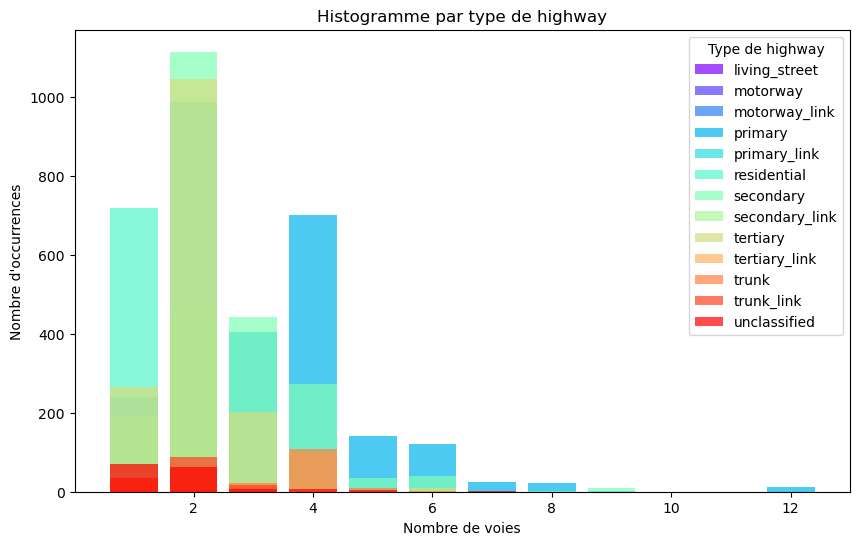

In [71]:
edges = gdf_edges_lanes[['highway','lanes']]

# Grouper par type de highway et compter le nombre d'occurrences pour chaque nombre de voies
hist_data = edges.groupby(['highway', 'lanes']).size().reset_index(name='count')

# Créer une palette de couleurs basée sur les types de highway uniques
color_palette = plt.cm.get_cmap('rainbow', len(hist_data['highway'].unique()))

# Tracer l'histogramme
fig, ax = plt.subplots(figsize=(10, 6))

for i, (highway_type, data) in enumerate(hist_data.groupby('highway')):
    color = color_palette(i)
    ax.bar(data['lanes'], data['count'], label=highway_type, alpha=0.7, color=color)

ax.set_xlabel('Nombre de voies')
ax.set_ylabel('Nombre d\'occurrences')
ax.set_title('Histogramme par type de highway')
ax.legend(title='Type de highway')

plt.show()

On peut voir que la majorité des voies secondaires ont deux voies.

In [57]:
gdf_edges_lanes['highway'].unique()

array(['residential', 'tertiary', 'primary', 'secondary', 'unclassified',
       'living_street', 'secondary_link', 'primary_link', 'trunk_link',
       'trunk', 'motorway_link', 'motorway', 'tertiary_link'],
      dtype=object)

# Attaquons nous au problème des parallel edges

Pour cela, on va essayer d'ajouter un noeud fictif au milieu de la rue parallèle, et en déduire deux nouvelles arêtes.

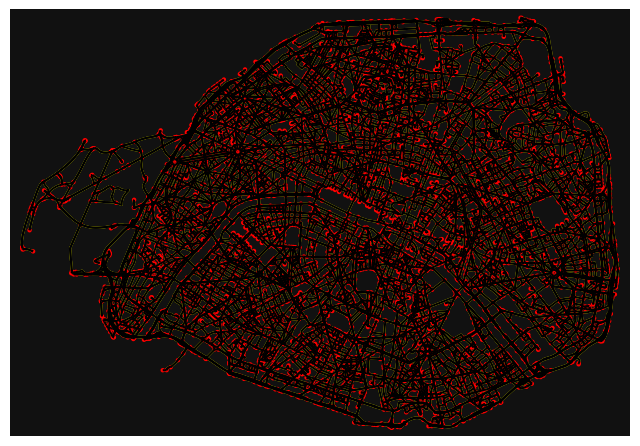

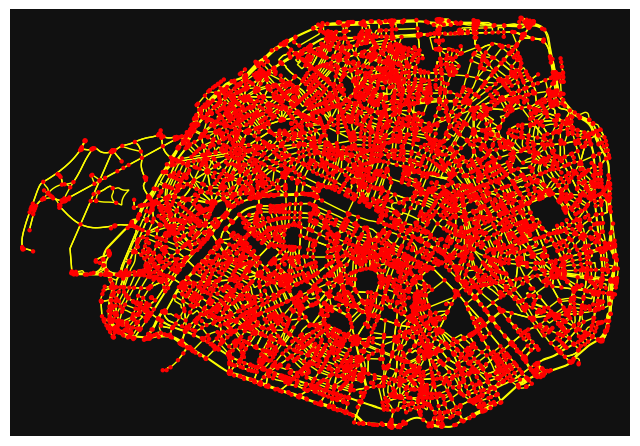

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [91]:
# Identifier les arêtes parallèles et les stocker dans un dictionnaire
parallel_edges = [(u,v,k) for u,v,k in Paris_base.edges if k !=0]

# Créer un nouveau graphe pour stocker le résultat
G_updated = Paris_base.copy()

# Pour chaque ensemble d'arêtes parallèles, ajouter un nœud fictif et deux arêtes fictives
for edges in parallel_edges:
    # Utiliser l'extrémité d'origine de l'ensemble d'arêtes comme position du nœud fictif
    u, v = edges[0],edges[1]
    x_mid, y_mid = (G_updated.nodes[u]['x']+G_updated.nodes[v]['x'])/2, (G_updated.nodes[u]['y']+G_updated.nodes[v]['y'])/2

    # Créer un nœud fictif à l'extrémité d'origine de l'ensemble d'arêtes
    new_node = max(G_updated.nodes) + 1
    G_updated.add_node(new_node, x=x_mid, y=y_mid)
    G_updated.remove_edge(u, v,k)
    G_updated.add_edge(u, new_node,0)
    G_updated.add_edge(new_node, v,0)


# Convertir le graphe mis à jour en GeoDataFrame
gdf_edges_updated = ox.graph_to_gdfs(G_updated, edges=True, nodes=False)['geometry']

# Visualiser le graphe mis à jour
fig, ax = ox.plot_graph(G_updated, node_color='red', edge_color='yellow', node_size=10, edge_linewidth=1.5, show=False)

# Ajouter les arêtes du GeoDataFrame pour la visualisation
gdf_edges_updated.plot(ax=ax, color='black', linewidth=1.5, alpha=1, zorder=2)

# Afficher le graphe original pour comparaison
ox.plot_graph(Paris_base, node_color='red', edge_color='yellow', node_size=10, edge_linewidth=1, show=True)


In [84]:
max(Paris_base.nodes)

11486390943

In [2]:
Epinettes = ox.graph_from_place('Epinettes, Paris', simplify = True, network_type = 'drive')

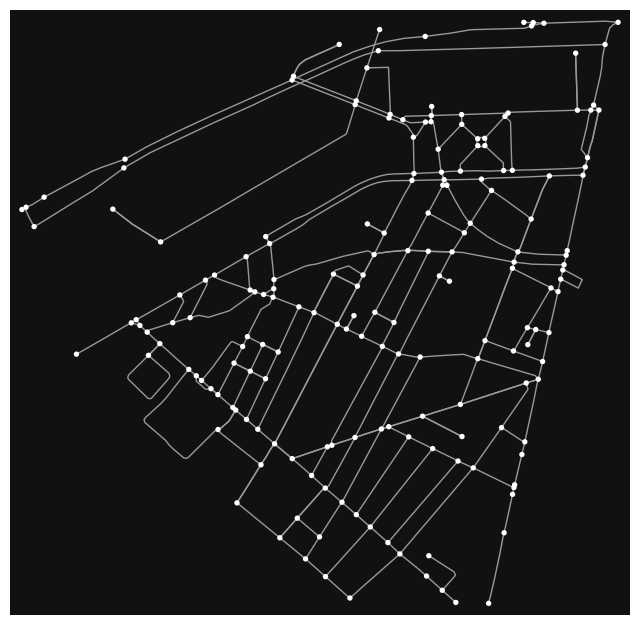

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [3]:
ox.plot_graph(Epinettes)

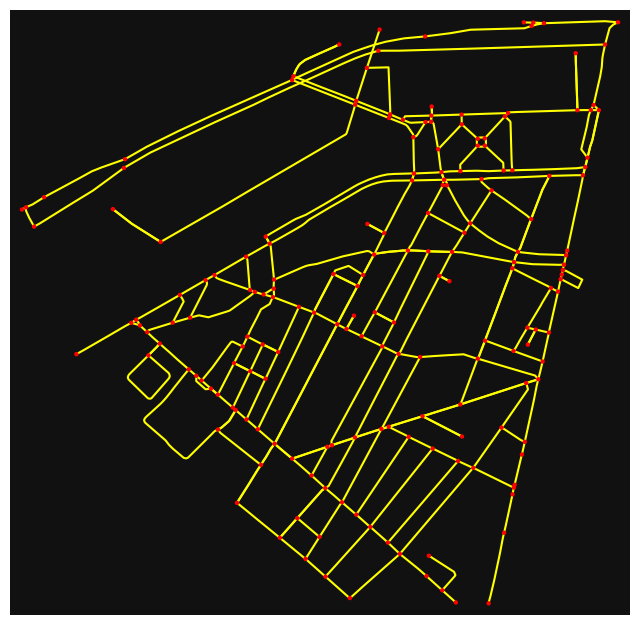

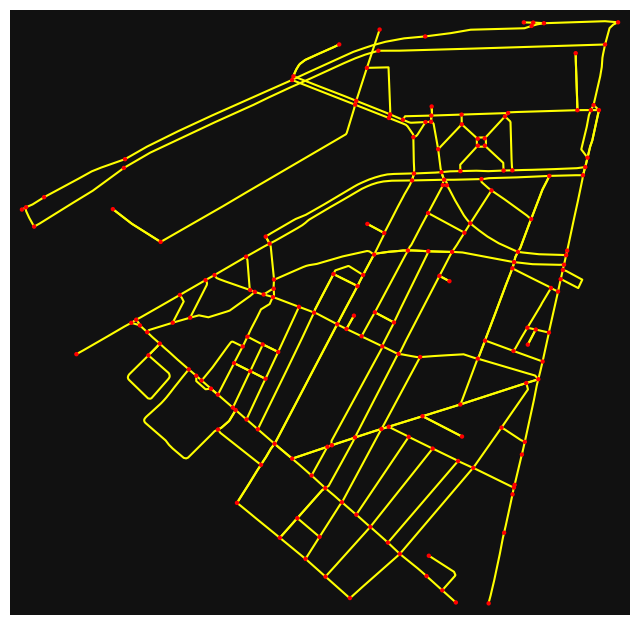

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [22]:
# Identifier les arêtes parallèles et les stocker dans un dictionnaire
parallel_edges = [(u,v,k) for u,v,k in Epinettes.edges if k !=0]

# Créer un nouveau graphe pour stocker le résultat
G_updated = Epinettes.copy()

edges_weight = nx.get_edge_attributes(Epinettes,'weight')
poids_renseigne = edges_weight != {}

# Pour chaque ensemble d'arêtes parallèles, ajouter un nœud fictif et deux arêtes fictives
for edge in parallel_edges:
    # Utiliser l'extrémité d'origine de l'ensemble d'arêtes comme position du nœud fictif
    u, v, k= edge[0], edge[1], edge[2]
    x_mid, y_mid = (G_updated.nodes[u]['x']+G_updated.nodes[v]['x'])/2, (G_updated.nodes[u]['y']+G_updated.nodes[v]['y'])/2

    # Créer un nœud fictif à l'extrémité d'origine de l'ensemble d'arêtes
    new_node = max(G_updated.nodes) + 1
    G_updated.add_node(new_node, x=x_mid, y=y_mid)
    
    if poids_renseigne :
        G_updated.add_edge(u,new_node,0,weight=edges_weight[(u,v,k)]/2)
        G_updated.add_edge(new_node,v,0,weight=edges_weight[(u,v,k)]/2)
    else :
        G_updated.add_edge(u,new_node,0)
        G_updated.add_edge(new_node,v,0)
    G_updated.remove_edge(u, v,k)

# Convertir le graphe mis à jour en GeoDataFrame
gdf_edges_updated = ox.graph_to_gdfs(G_updated, edges=True, nodes=False)['geometry']

# Visualiser le graphe mis à jour
fig, ax = ox.plot_graph(G_updated, node_color='red', edge_color='yellow', node_size=10, edge_linewidth=1.5, show=False)


# Afficher le graphe original pour comparaison
ox.plot_graph(Epinettes, node_color='red', edge_color='yellow', node_size=10, edge_linewidth=1.5, show=True)


In [17]:
for edge in Epinettes.edges:
    if edge[2] != 0:
        print(edge)

(2113435429, 2113435434, 1)


In [18]:
nx.get_edge_attributes(Epinettes,'weight')

{}

[(138, 753, 0), (190, 8784, 0), (194, 480, 0), (195, 478, 0), (196, 197, 0), (379, 6548, 0), (486, 514, 0), (696, 8554, 0), (748, 753, 0), (1473, 9433, 0), (1502, 5628, 0), (1679, 5590, 0), (1680, 1681, 0), (1819, 7142, 0), (1890, 9330, 0), (2726, 2727, 0), (2730, 9452, 0), (2731, 4879, 0), (3473, 8107, 0), (3475, 9477, 0), (3495, 9534, 0), (3596, 8320, 0), (4905, 6132, 0), (4910, 6129, 0), (5247, 6365, 0), (5364, 5626, 0), (5393, 8749, 0), (5551, 9476, 0), (5748, 5749, 0), (6146, 6980, 0), (6235, 6526, 0), (6235, 8808, 0), (6255, 9451, 0), (6550, 6551, 0), (6981, 7468, 0), (7214, 7413, 0), (7544, 9334, 0), (7566, 8156, 0), (7895, 9470, 0), (9328, 9342, 0), (9372, 9373, 0), (9377, 9492, 0)]
1425


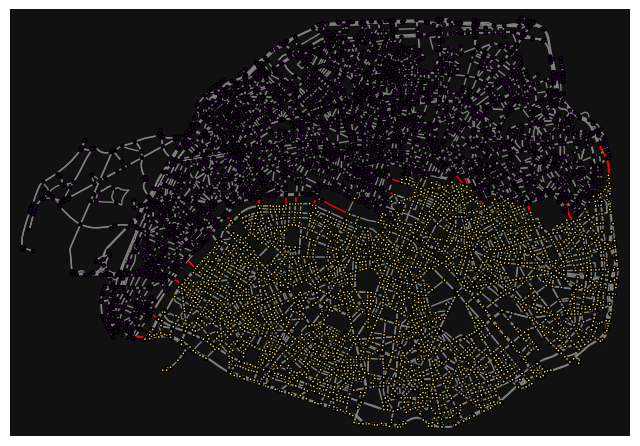

In [27]:
mes_modules.from_ox_to_coupe(Paris_base,2,0.01,2)

[(121, 2235, 0), (122, 2234, 0), (149, 9532, 0), (173, 6467, 0), (185, 245, 0), (186, 248, 0), (190, 191, 0), (198, 4829, 0), (199, 733, 0), (230, 3462, 0), (329, 9559, 0), (546, 3464, 0), (699, 8070, 0), (734, 2693, 0), (956, 9174, 0), (986, 2367, 0), (1482, 5668, 0), (1668, 8991, 0), (1864, 5715, 0), (1889, 1893, 0), (1895, 7534, 0), (1897, 1903, 0), (1902, 8772, 0), (2064, 3080, 0), (2236, 8581, 0), (2256, 2257, 0), (2266, 2267, 0), (2268, 6609, 0), (2362, 6557, 0), (2369, 2370, 0), (2681, 2699, 0), (2691, 2706, 0), (2692, 3075, 0), (2696, 8069, 0), (5669, 9321, 0), (6450, 9558, 0), (6997, 8342, 0), (7224, 7837, 0)]
38


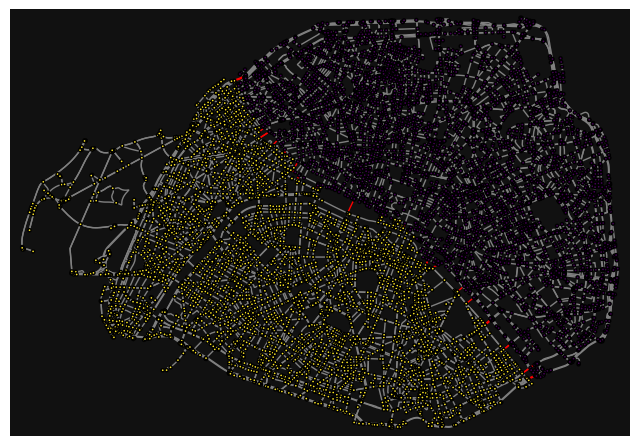

In [3]:
mes_modules.from_ox_to_coupe_fictive_node(Paris_base,2,0.01,2)

# La coupe est différente si l'ont prend en compte les parallel edges !

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9638
15031.0
[(107, 7536, 0), (149, 9532, 0), (175, 176, 0), (185, 245, 0), (186, 248, 0), (189, 1883, 0), (190, 191, 0), (198, 4829, 0), (199, 733, 0), (217, 2494, 0), (273, 566, 0), (326, 2442, 0), (326, 2446, 0), (354, 8479, 0), (567, 625, 0), (699, 8070, 0), (734, 2693, 0), (955, 956, 0), (956, 960, 0), (976, 977, 0), (981, 6608, 0), (1470, 7907, 0), (1482, 5668, 0), (1669, 5579, 0), (1670, 5581, 0), (2064, 3080, 0), (2362, 6557, 0), (2405, 2406, 0), (2409, 2415, 0), (2410, 2417, 0), (2411, 6314, 0), (2451, 9140, 0), (2681, 2699, 0), (2691, 2706, 0), (2692, 3075, 0), (2696, 8069, 0), (5077, 6466, 0), (5083, 9335, 0), (5087, 9336, 0), (5669, 9321, 0), (6463, 9300, 0), (7182, 9301, 0), (7224, 7837, 0), (7518, 9527, 0), (8901, 8902, 0)]
45


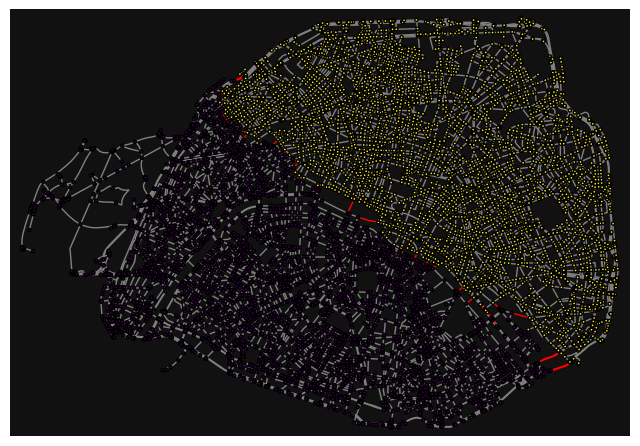

In [13]:
mes_modules.from_ox_to_coupe_valuee(Paris_base,2, 0.01, 2)

In [4]:
len(nx.get_edge_attributes(Paris_base,'highway'))

18489

In [5]:
len(Paris_base.edges)

18489

In [6]:
list(Paris_base.edges)

[(125730, 268675130, 0),
 (125730, 21112878, 0),
 (125730, 244455548, 0),
 (125730, 1089076182, 0),
 (125742, 60912980, 0),
 (125742, 206155932, 0),
 (125742, 244455433, 0),
 (125743, 244455500, 0),
 (125745, 25245021, 0),
 (125745, 125743, 0),
 (125747, 125745, 0),
 (125748, 84791125, 0),
 (125760, 8220750778, 0),
 (360930, 480690113, 0),
 (360930, 361704, 0),
 (360932, 253316556, 0),
 (360932, 100289178, 0),
 (360932, 252659093, 0),
 (360932, 21657548, 0),
 (360935, 246999158, 0),
 (360935, 251514416, 0),
 (360935, 246263427, 0),
 (360935, 1829061660, 0),
 (360935, 246998815, 0),
 (360937, 360938, 0),
 (360937, 921170521, 0),
 (360937, 49889917, 0),
 (360938, 246999320, 0),
 (360938, 360937, 0),
 (360938, 49889201, 0),
 (360938, 100292096, 0),
 (360946, 36598216, 0),
 (360946, 36481290, 0),
 (360977, 125385881, 0),
 (360977, 36480709, 0),
 (360977, 36480662, 0),
 (360978, 36476892, 0),
 (360978, 36476946, 0),
 (360980, 5700619789, 0),
 (360980, 1762423633, 0),
 (360980, 322690568, 0)

In [6]:
mes_modules.villes_exemple()

['Milan, Italie',
 'Napoli, Italie',
 'New_York',
 'Shanghai',
 'Sidney',
 'Washington_D.C._USA',
 'Varsovie, Pologne',
 'Chicago, USA',
 'Bruxelles, Belgique',
 'Bombay',
 'Barcelone, Espagne',
 'Bordeaux']

In [7]:
Bordeaux = ox.load_graphml(filepath = 'Bordeaux.graphml')

In [10]:
Varsovie = ox.load_graphml(filepath = 'Varsovie_Pologne.graphml')

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


[(292, 800, 0), (292, 801, 0), (643, 13565, 0), (643, 14838, 0), (679, 4233, 0), (741, 18408, 0), (806, 1809, 0), (806, 14866, 0), (1294, 10982, 0), (1434, 9554, 0), (1436, 1437, 0), (1474, 1477, 0), (1476, 1477, 0), (1483, 1484, 0), (1483, 19246, 0), (1500, 1502, 0), (1501, 1503, 0), (1503, 19246, 0), (2255, 7266, 0), (2256, 14543, 0), (2509, 2605, 0), (2510, 14471, 0), (2577, 18408, 0), (2600, 9031, 0), (3021, 10984, 0), (3021, 11912, 0), (3036, 9554, 0), (3043, 11060, 0), (3728, 6141, 0), (3728, 6145, 0), (3729, 8910, 0), (3729, 8923, 0), (3809, 8908, 0), (4159, 8858, 0), (4232, 4233, 0), (4614, 8878, 0), (6139, 6143, 0), (7265, 7266, 0), (8857, 8858, 0), (8877, 8878, 0), (9208, 9209, 0), (9209, 12003, 0), (9299, 16171, 0), (9410, 9412, 0), (9494, 13942, 0), (10749, 11223, 0), (10749, 11225, 0), (11040, 11781, 0), (11041, 11055, 0), (11054, 11055, 0), (11056, 11059, 0), (11058, 11059, 0), (11277, 14543, 0), (11474, 18033, 0), (11673, 14687, 0), (11779, 11780, 0), (13371, 13373, 0), 

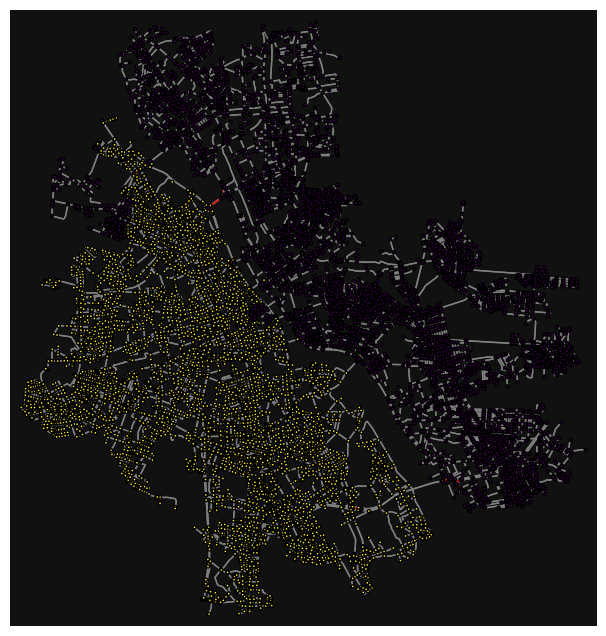

In [11]:
mes_modules.from_ox_to_coupe_valuee(Varsovie,2, 0.1, 2, val = 'width_squared')

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Erreur dans le traitement du graphe de la ville de Milan, Italie.


/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Erreur dans le traitement du graphe de la ville de Napoli, Italie.


/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Erreur dans le traitement du graphe de la ville de New_York.


/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Erreur dans le traitement du graphe de la ville de Shanghai.


/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Erreur dans le traitement du graphe de la ville de Sidney.


/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Erreur dans le traitement du graphe de la ville de Washington_D.C._USA.


/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


[(292, 800, 0), (292, 801, 0), (643, 13565, 0), (643, 14838, 0), (679, 4233, 0), (741, 18408, 0), (806, 1809, 0), (806, 14866, 0), (1294, 10982, 0), (1434, 9554, 0), (1436, 1437, 0), (1474, 1477, 0), (1476, 1477, 0), (1483, 1484, 0), (1483, 19246, 0), (1500, 1502, 0), (1501, 1503, 0), (1503, 19246, 0), (2255, 7266, 0), (2256, 14543, 0), (2509, 2605, 0), (2510, 14471, 0), (2577, 18408, 0), (2600, 9031, 0), (3021, 10984, 0), (3021, 11912, 0), (3036, 9554, 0), (3043, 11060, 0), (3728, 6141, 0), (3728, 6145, 0), (3729, 8910, 0), (3729, 8923, 0), (3809, 8908, 0), (4159, 8858, 0), (4232, 4233, 0), (4614, 8878, 0), (6139, 6143, 0), (7265, 7266, 0), (8857, 8858, 0), (8877, 8878, 0), (9208, 9209, 0), (9209, 12003, 0), (9299, 16171, 0), (9410, 9412, 0), (9494, 13942, 0), (10749, 11223, 0), (10749, 11225, 0), (11040, 11781, 0), (11041, 11055, 0), (11054, 11055, 0), (11056, 11059, 0), (11058, 11059, 0), (11277, 14543, 0), (11474, 18033, 0), (11673, 14687, 0), (11779, 11780, 0), (13371, 13373, 0), 

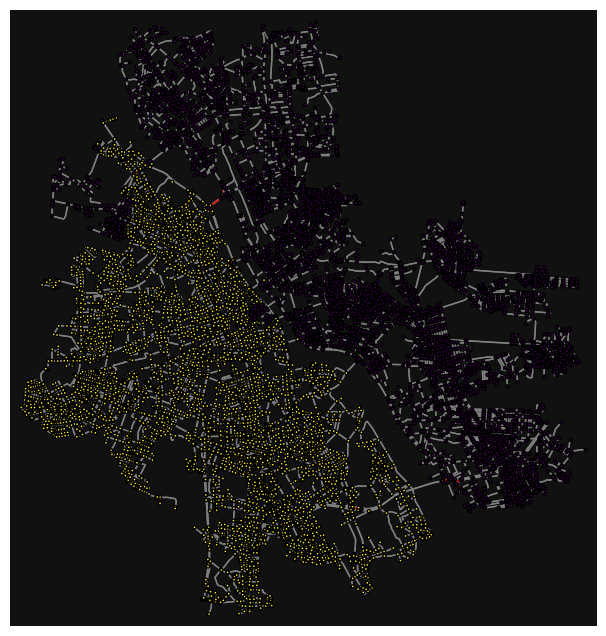

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Erreur dans le traitement du graphe de la ville de Chicago, USA.


/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


[(292, 625, 0), (560, 2062, 0), (561, 990, 0), (581, 1973, 0), (605, 1815, 0), (608, 609, 0), (613, 1735, 0), (629, 1805, 0), (1108, 1730, 0), (1728, 1730, 0), (1737, 1744, 0)]
425


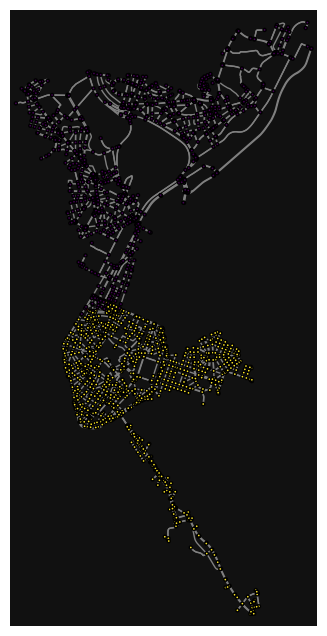

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Erreur dans le traitement du graphe de la ville de Bombay.


/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


[(20, 7316, 0), (58, 6824, 0), (62, 63, 0), (65, 1975, 0), (178, 2462, 0), (289, 3672, 0), (318, 3671, 0), (430, 7902, 0), (866, 867, 0), (1293, 1526, 0), (1306, 1428, 0), (1310, 1311, 0), (1447, 1861, 0), (1448, 1610, 0), (1451, 1460, 0), (1452, 1461, 0), (1454, 1482, 0), (1514, 5930, 0), (1526, 1527, 0), (1530, 5935, 0), (1531, 3670, 0), (1604, 1840, 0), (1728, 7810, 0), (1837, 8637, 0), (1860, 4234, 0), (1946, 7482, 0), (1946, 7976, 0), (1957, 3333, 0), (1975, 7608, 0), (1976, 1980, 0), (2127, 6007, 0), (2142, 2318, 0), (2154, 7318, 0), (2304, 8170, 0), (2459, 3673, 0), (2459, 8829, 0), (2463, 2637, 0), (2471, 7976, 0), (2471, 8743, 0), (2559, 3268, 0), (3110, 3111, 0), (3111, 6940, 0), (3222, 5661, 0), (3254, 3940, 0), (3254, 4337, 0), (3272, 5512, 0), (3335, 6942, 0), (3401, 3402, 0), (3408, 3414, 0), (3580, 4247, 0), (3587, 3589, 0), (3606, 5235, 0), (4141, 4142, 0), (4142, 7482, 0), (5999, 7053, 0), (6936, 6940, 0), (6936, 7432, 0), (7319, 7905, 0), (7902, 7904, 0), (7979, 8856,

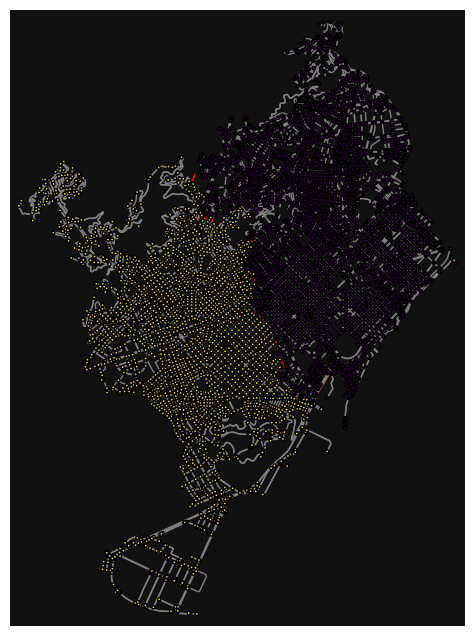

Erreur dans le traitement du graphe de la ville de Bordeaux.


/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [13]:
for ville in mes_modules.villes_exemple():
    G = ox.load_graphml(filepath = f'{ville.replace(", ","_").replace(" ","_")}.graphml')
    try:
        mes_modules.from_ox_to_coupe_valuee(G,2, 0.1, 2, val = 'width_squared')
    except:
        print(f'Erreur dans le traitement du graphe de la ville de {ville}.')

In [6]:
len(Paris_base.edges)

18489

In [10]:
Paris_undi = Paris_base.to_undirected()

In [11]:
len(Paris_undi.edges)

15020

In [12]:
Paris_undi.remove_edges_from(nx.selfloop_edges(Paris_undi))

In [14]:
len(Paris_undi.edges)

14995

In [16]:
Paris_undi = mes_modules.add_fictive_node(Paris_undi)

In [17]:
len(Paris_undi.edges)

15031

In [18]:
len(Paris_undi.nodes)

9638

In [19]:
len(Paris_base.edges)


18489

In [23]:
list(Paris_base.edges)

[(125730, 268675130, 0),
 (125730, 21112878, 0),
 (125730, 244455548, 0),
 (125730, 1089076182, 0),
 (125742, 60912980, 0),
 (125742, 206155932, 0),
 (125742, 244455433, 0),
 (125743, 244455500, 0),
 (125745, 25245021, 0),
 (125745, 125743, 0),
 (125747, 125745, 0),
 (125748, 84791125, 0),
 (125760, 8220750778, 0),
 (360930, 480690113, 0),
 (360930, 361704, 0),
 (360932, 253316556, 0),
 (360932, 100289178, 0),
 (360932, 252659093, 0),
 (360932, 21657548, 0),
 (360935, 246999158, 0),
 (360935, 251514416, 0),
 (360935, 246263427, 0),
 (360935, 1829061660, 0),
 (360935, 246998815, 0),
 (360937, 360938, 0),
 (360937, 921170521, 0),
 (360937, 49889917, 0),
 (360938, 246999320, 0),
 (360938, 360937, 0),
 (360938, 49889201, 0),
 (360938, 100292096, 0),
 (360946, 36598216, 0),
 (360946, 36481290, 0),
 (360977, 125385881, 0),
 (360977, 36480709, 0),
 (360977, 36480662, 0),
 (360978, 36476892, 0),
 (360978, 36476946, 0),
 (360980, 5700619789, 0),
 (360980, 1762423633, 0),
 (360980, 322690568, 0)

In [8]:
len(Paris_base)

9602

In [9]:
ox.save_graphml(Paris_base, filepath = 'Paris.graphml')

In [2]:
Paris_saved = ox.load_graphml(filepath = 'Paris.graphml')

In [11]:
len(Paris_saved)

9602

In [6]:
nx.get_edge_attributes(Paris_saved,'maxspeed')

{(125730, 268675130, 0): '30',
 (125730, 21112878, 0): '30',
 (125730, 244455548, 0): '30',
 (125730, 1089076182, 0): '30',
 (125742, 60912980, 0): '30',
 (125742, 206155932, 0): '30',
 (125742, 244455433, 0): '30',
 (125743, 244455500, 0): '30',
 (125745, 25245021, 0): '70',
 (125745, 125743, 0): '30',
 (125747, 125745, 0): '30',
 (125748, 84791125, 0): '30',
 (125760, 8220750778, 0): '30',
 (360930, 480690113, 0): '30',
 (360930, 361704, 0): '30',
 (360932, 253316556, 0): '30',
 (360932, 100289178, 0): '30',
 (360932, 252659093, 0): '30',
 (360932, 21657548, 0): '30',
 (360935, 246999158, 0): '30',
 (360935, 251514416, 0): '30',
 (360935, 246263427, 0): '30',
 (360935, 1829061660, 0): '30',
 (360935, 246998815, 0): '30',
 (360937, 360938, 0): '30',
 (360937, 921170521, 0): '30',
 (360937, 49889917, 0): '30',
 (360938, 246999320, 0): '30',
 (360938, 360937, 0): '30',
 (360938, 49889201, 0): '30',
 (360938, 100292096, 0): '30',
 (360946, 36598216, 0): '30',
 (360946, 36481290, 0): '30'

In [5]:
ox.add_edge_speeds(Paris_saved)

In [2]:
Paris = ox.load_graphml(filepath = 'Paris_Paris_tol_4.graphml')

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


40510
46685.0
[(200, 201, 0), (456, 458, 0), (461, 25046, 0), (463, 36734, 0), (467, 33644, 0), (529, 530, 0), (625, 20037, 0), (661, 18939, 0), (663, 39161, 0), (777, 30957, 0), (789, 15777, 0), (1276, 1277, 0), (1416, 1418, 0), (1421, 1424, 0), (1793, 1794, 0), (2691, 27238, 0), (4432, 34513, 0), (4471, 4474, 0), (4476, 4477, 0), (5287, 5288, 0), (6018, 6019, 0), (6067, 27237, 0), (6121, 6122, 0), (6278, 6291, 0), (6302, 6303, 0), (7995, 7996, 0), (8037, 34517, 0), (8059, 38278, 0), (8063, 8064, 0), (8369, 8371, 0), (16182, 23154, 0), (16186, 16187, 0), (16188, 16190, 0), (18933, 25100, 0), (20657, 20658, 0), (21578, 29893, 0), (30572, 34015, 0), (34892, 35016, 0)]
52240
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

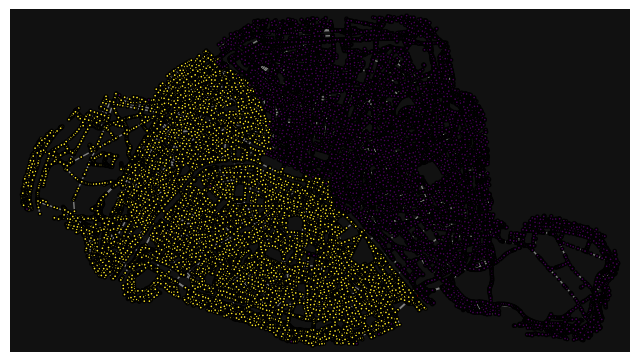

In [3]:
mes_modules.from_ox_to_coupe_valuee_maxspeed(Paris,2,0.1,2)

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


40510
46685.0
[(137, 18918, 0), (142, 7038, 0), (456, 458, 0), (461, 25046, 0), (463, 36734, 0), (467, 33644, 0), (642, 27345, 0), (902, 903, 0), (975, 977, 0), (1276, 1277, 0), (1416, 1418, 0), (1421, 1424, 0), (2692, 2694, 0), (2693, 16180, 0), (4406, 29722, 0), (4422, 23300, 0), (4432, 34513, 0), (4467, 17391, 0), (5076, 5077, 0), (5302, 5305, 0), (5306, 5312, 0), (6011, 6014, 0), (6278, 6291, 0), (6302, 6303, 0), (6761, 6940, 0), (6900, 37258, 0), (7042, 7043, 0), (8037, 34517, 0), (8059, 38278, 0), (8063, 8064, 0), (8369, 8371, 0), (8506, 16187, 0), (13163, 13164, 0), (13350, 13351, 0), (15376, 15377, 0), (16182, 16183, 0), (16188, 16190, 0), (18929, 18930, 0), (20657, 20658, 0), (20912, 38023, 0), (21021, 23042, 0), (21578, 29893, 0), (24077, 32462, 0), (24509, 24510, 0), (24511, 26425, 0), (28854, 34391, 0), (34892, 35016, 0)]
427
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

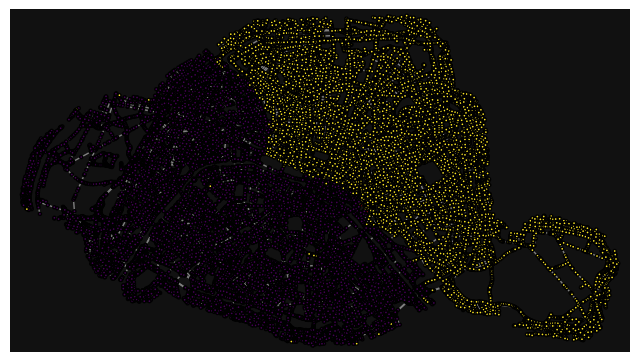

In [5]:
mes_modules.from_ox_to_coupe_valuee(Paris,2,0.1,2,'width')

Pas de différence notable entre width et width pénalisé

In [14]:
mes_modules.from_ox_to_coupe_valuee_betweenness(2, 0.1, 2)

KeyError: (219, 25425, 1)

In [2]:
Paris = ox.load_graphml(filepath = 'Paris_Paris_tol_4.graphml')

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


40510
46685.0
[(456, 458, 0), (461, 25046, 0), (463, 36734, 0), (467, 33644, 0), (529, 530, 0), (625, 20037, 0), (663, 39161, 0), (676, 29243, 0), (788, 789, 0), (832, 18939, 0), (1416, 1418, 0), (1419, 37551, 0), (1421, 1424, 0), (1793, 1794, 0), (2691, 27238, 0), (4432, 34513, 0), (4476, 4477, 0), (4486, 17396, 0), (5287, 5288, 0), (6018, 6019, 0), (6067, 27237, 0), (6121, 6122, 0), (6289, 6291, 0), (6319, 6328, 0), (6325, 6326, 0), (7995, 7996, 0), (8037, 34517, 0), (8059, 38278, 0), (8063, 8064, 0), (16182, 23154, 0), (16186, 16187, 0), (16190, 27744, 0), (18934, 29051, 0), (20657, 20658, 0), (27135, 27136, 0), (29893, 29927, 0), (32958, 32959, 0), (34892, 35016, 0)]
38
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

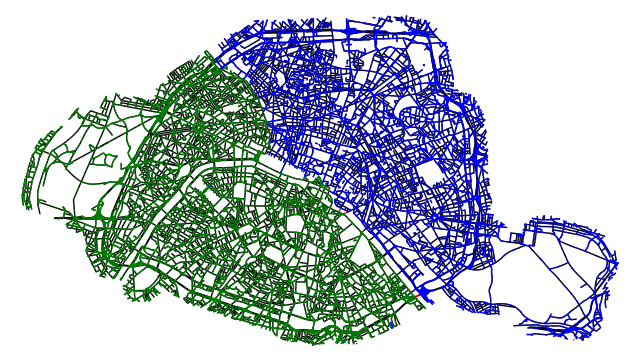

In [3]:
mes_modules.from_ox_to_coupe_valuee(Paris, 2, 0.1, 2,val=None)

In [4]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(Paris)

In [5]:
len(gdf_edges.loc[~gdf_edges['width'].isna()])/len(gdf_edges)

0.031564842769429086

In [6]:
len(gdf_edges.loc[~gdf_edges['lanes'].isna()])/len(gdf_edges)

0.5037653923131721

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


40510
46685.0
[(137, 18918, 0), (142, 7038, 0), (456, 458, 0), (461, 25046, 0), (463, 36734, 0), (467, 33644, 0), (642, 27345, 0), (902, 903, 0), (975, 977, 0), (1276, 1277, 0), (1416, 1418, 0), (1421, 1424, 0), (2692, 2694, 0), (2693, 16180, 0), (4406, 29722, 0), (4422, 23300, 0), (4432, 34513, 0), (4467, 17391, 0), (5076, 5077, 0), (5302, 5305, 0), (5306, 5312, 0), (6011, 6014, 0), (6278, 6291, 0), (6302, 6303, 0), (6761, 6940, 0), (6900, 37258, 0), (7042, 7043, 0), (8037, 34517, 0), (8059, 38278, 0), (8063, 8064, 0), (8369, 8371, 0), (8506, 16187, 0), (13163, 13164, 0), (13350, 13351, 0), (15376, 15377, 0), (16182, 16183, 0), (16188, 16190, 0), (18929, 18930, 0), (20657, 20658, 0), (20912, 38023, 0), (21021, 23042, 0), (21578, 29893, 0), (24077, 32462, 0), (24509, 24510, 0), (24511, 26425, 0), (28854, 34391, 0), (34892, 35016, 0)]
427
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

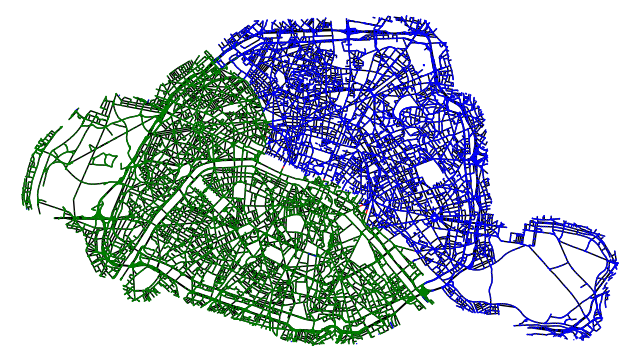

In [7]:
mes_modules.from_ox_to_coupe_valuee(Paris, 2, 0.1, 2,val='width')

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


40510
46685.0
[(171, 3091, 0), (234, 239, 0), (256, 259, 0), (485, 487, 0), (642, 27345, 0), (1020, 25206, 0), (1314, 1317, 0), (1410, 1411, 0), (1410, 27432, 0), (1414, 1415, 0), (1572, 17500, 0), (2274, 2277, 0), (2494, 2885, 0), (2494, 2917, 0), (2495, 28949, 0), (2604, 2605, 0), (2618, 2620, 0), (2643, 2645, 0), (2789, 2792, 0), (2918, 2921, 0), (3532, 3533, 0), (3532, 25330, 0), (3535, 35795, 0), (3552, 16239, 0), (3590, 16237, 0), (3631, 3647, 0), (3636, 36248, 0), (3666, 3667, 0), (3676, 19539, 0), (3689, 3691, 0), (3715, 3716, 0), (4235, 37421, 0), (4236, 37419, 0), (4272, 29056, 0), (4307, 33310, 0), (4420, 4457, 0), (4427, 4428, 0), (5124, 15557, 0), (6828, 6829, 0), (6857, 15924, 0), (6903, 24059, 0), (6904, 6905, 0), (6926, 27436, 0), (6984, 37446, 0), (6990, 27498, 0), (8680, 8681, 0), (9774, 9785, 0), (9893, 9894, 0), (9894, 25996, 0), (11121, 11122, 0), (11319, 11646, 0), (11622, 11624, 0), (11651, 31507, 0), (11849, 11850, 0), (11863, 32919, 0), (11941, 11942, 0), (1200

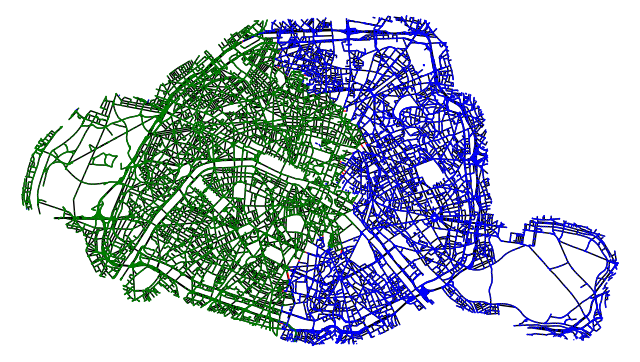

In [9]:
mes_modules.from_ox_to_coupe_valuee(Paris, 2, 0.1, 2,val='width_squared')

In [12]:
len([(137, 18918, 0), (142, 7038, 0), (456, 458, 0), (461, 25046, 0), (463, 36734, 0), (467, 33644, 0), (642, 27345, 0), (902, 903, 0), (975, 977, 0), (1276, 1277, 0), (1416, 1418, 0), (1421, 1424, 0), (2692, 2694, 0), (2693, 16180, 0), (4406, 29722, 0), (4422, 23300, 0), (4432, 34513, 0), (4467, 17391, 0), (5076, 5077, 0), (5302, 5305, 0), (5306, 5312, 0), (6011, 6014, 0), (6278, 6291, 0), (6302, 6303, 0), (6761, 6940, 0), (6900, 37258, 0), (7042, 7043, 0), (8037, 34517, 0), (8059, 38278, 0), (8063, 8064, 0), (8369, 8371, 0), (8506, 16187, 0), (13163, 13164, 0), (13350, 13351, 0), (15376, 15377, 0), (16182, 16183, 0), (16188, 16190, 0), (18929, 18930, 0), (20657, 20658, 0), (20912, 38023, 0), (21021, 23042, 0), (21578, 29893, 0), (24077, 32462, 0), (24509, 24510, 0), (24511, 26425, 0), (28854, 34391, 0), (34892, 35016, 0)])

47

In [13]:
len([(171, 3091, 0), (234, 239, 0), (256, 259, 0), (485, 487, 0), (642, 27345, 0), (1020, 25206, 0), (1314, 1317, 0), (1410, 1411, 0), (1410, 27432, 0), (1414, 1415, 0), (1572, 17500, 0), (2274, 2277, 0), (2494, 2885, 0), (2494, 2917, 0), (2495, 28949, 0), (2604, 2605, 0), (2618, 2620, 0), (2643, 2645, 0), (2789, 2792, 0), (2918, 2921, 0), (3532, 3533, 0), (3532, 25330, 0), (3535, 35795, 0), (3552, 16239, 0), (3590, 16237, 0), (3631, 3647, 0), (3636, 36248, 0), (3666, 3667, 0), (3676, 19539, 0), (3689, 3691, 0), (3715, 3716, 0), (4235, 37421, 0), (4236, 37419, 0), (4272, 29056, 0), (4307, 33310, 0), (4420, 4457, 0), (4427, 4428, 0), (5124, 15557, 0), (6828, 6829, 0), (6857, 15924, 0), (6903, 24059, 0), (6904, 6905, 0), (6926, 27436, 0), (6984, 37446, 0), (6990, 27498, 0), (8680, 8681, 0), (9774, 9785, 0), (9893, 9894, 0), (9894, 25996, 0), (11121, 11122, 0), (11319, 11646, 0), (11622, 11624, 0), (11651, 31507, 0), (11849, 11850, 0), (11863, 32919, 0), (11941, 11942, 0), (12002, 12004, 0), (12009, 12010, 0), (12657, 19737, 0), (12658, 12659, 0), (13633, 31435, 0), (13904, 18341, 0), (14617, 14618, 0), (15671, 36552, 0), (15672, 15673, 0), (15891, 20075, 0), (15912, 15913, 0), (16264, 30065, 0), (16272, 32204, 0), (17389, 37675, 0), (21559, 21560, 0), (21559, 21561, 0), (22291, 35604, 0), (23804, 23806, 0), (23806, 24061, 0), (26039, 26040, 0), (26470, 26471, 0), (30426, 33708, 0), (31882, 31884, 0), (32205, 32206, 0), (37615, 37638, 0)])

81

Nombre de noeuds: 40473
Nombre d'arêtes: 46611
[(677, 6748, 0), (693, 5007, 0), (716, 9612, 0), (1243, 28067, 0), (1262, 9599, 0), (1288, 34806, 0), (1291, 1292, 0), (1313, 13680, 0), (1573, 1576, 0), (1580, 1582, 0), (2292, 2294, 0), (2468, 32591, 0), (2478, 11165, 0), (2777, 2778, 0), (2777, 23121, 0), (4410, 4412, 0), (5008, 5018, 0), (5009, 34306, 0), (5012, 5022, 0), (5015, 5016, 0), (5038, 5040, 0), (5465, 5467, 0), (5469, 5472, 0), (6382, 27193, 0), (9623, 9624, 0), (9681, 9682, 0), (10359, 10360, 0), (10391, 10392, 0), (10391, 26055, 0), (11069, 15888, 0), (11168, 25893, 0), (11172, 25895, 0), (11174, 25894, 0), (12243, 12244, 0), (12317, 12318, 0), (12353, 12355, 0), (12376, 35577, 0), (12404, 23790, 0), (12549, 12551, 0), (13265, 31268, 0), (13706, 14302, 0), (14308, 23163, 0), (14315, 34795, 0), (14318, 14321, 0), (14322, 14324, 0), (14330, 14331, 0), (14340, 33661, 0), (14353, 14355, 0), (14357, 14359, 0), (14770, 37588, 0), (14841, 26628, 0), (14847, 25942, 0), (14853, 148

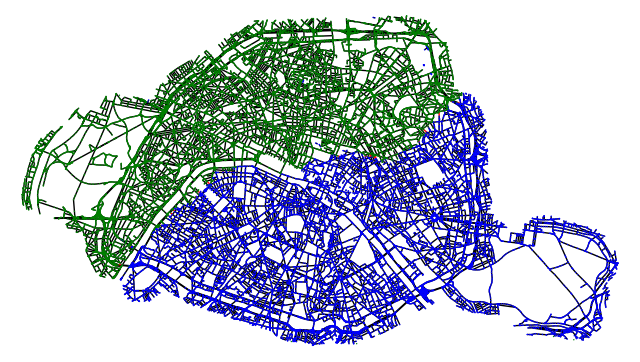

In [2]:
mes_modules.coupe_betweenness_Paris_tol_4(2,0.1,2)

In [3]:
len([(677, 6748, 0), (693, 5007, 0), (716, 9612, 0), (1243, 28067, 0), (1262, 9599, 0), (1288, 34806, 0), (1291, 1292, 0), (1313, 13680, 0), (1573, 1576, 0), (1580, 1582, 0), (2292, 2294, 0), (2468, 32591, 0), (2478, 11165, 0), (2777, 2778, 0), (2777, 23121, 0), (4410, 4412, 0), (5008, 5018, 0), (5009, 34306, 0), (5012, 5022, 0), (5015, 5016, 0), (5038, 5040, 0), (5465, 5467, 0), (5469, 5472, 0), (6382, 27193, 0), (9623, 9624, 0), (9681, 9682, 0), (10359, 10360, 0), (10391, 10392, 0), (10391, 26055, 0), (11069, 15888, 0), (11168, 25893, 0), (11172, 25895, 0), (11174, 25894, 0), (12243, 12244, 0), (12317, 12318, 0), (12353, 12355, 0), (12376, 35577, 0), (12404, 23790, 0), (12549, 12551, 0), (13265, 31268, 0), (13706, 14302, 0), (14308, 23163, 0), (14315, 34795, 0), (14318, 14321, 0), (14322, 14324, 0), (14330, 14331, 0), (14340, 33661, 0), (14353, 14355, 0), (14357, 14359, 0), (14770, 37588, 0), (14841, 26628, 0), (14847, 25942, 0), (14853, 14854, 0), (15094, 34275, 0), (15095, 15096, 0), (15819, 30753, 0), (16810, 35589, 0), (16814, 16817, 0), (16936, 34284, 0), (16938, 16939, 0), (17180, 36185, 0), (17183, 36183, 0), (17626, 17629, 0), (19191, 19192, 0), (19194, 19195, 0), (19823, 27588, 0), (20108, 20110, 0), (20788, 28646, 0), (20794, 23015, 0), (20805, 23019, 0), (21506, 30770, 0), (23545, 23546, 0), (25323, 33058, 0), (25902, 25904, 0), (25942, 25943, 0), (26606, 34707, 0), (26627, 31211, 0), (27192, 32444, 0), (27293, 34315, 0), (28645, 36209, 0), (29148, 34709, 0), (29213, 36893, 0), (29609, 32581, 0), (33273, 35892, 0), (34606, 34607, 0), (35686, 35687, 0), (35850, 35851, 0), (36224, 36579, 0), (38795, 38796, 0), (39645, 39646, 0)])

90

In [2]:
Paris = ox.load_graphml(filepath = 'Paris_Paris_tol_4.graphml')

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


40510
46685.0
[(456, 458, 0), (461, 25046, 0), (463, 36734, 0), (467, 33644, 0), (529, 530, 0), (625, 20037, 0), (663, 39161, 0), (676, 29243, 0), (788, 789, 0), (832, 18939, 0), (1416, 1418, 0), (1419, 37551, 0), (1421, 1424, 0), (1793, 1794, 0), (2691, 27238, 0), (4432, 34513, 0), (4476, 4477, 0), (4486, 17396, 0), (5287, 5288, 0), (6018, 6019, 0), (6067, 27237, 0), (6121, 6122, 0), (6289, 6291, 0), (6319, 6328, 0), (6325, 6326, 0), (7995, 7996, 0), (8037, 34517, 0), (8059, 38278, 0), (8063, 8064, 0), (16182, 23154, 0), (16186, 16187, 0), (16190, 27744, 0), (18934, 29051, 0), (20657, 20658, 0), (27135, 27136, 0), (29893, 29927, 0), (32958, 32959, 0), (34892, 35016, 0)]
38
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

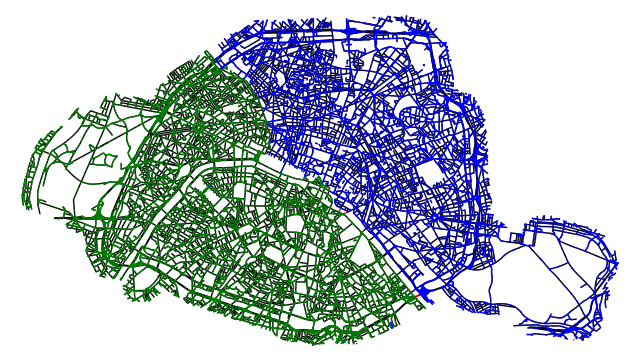

In [3]:
mes_modules.from_ox_to_coupe_valuee(Paris,2,0.1,2)

In [4]:
t = mes_modules.betweenness_Paris_tol_4_bis()


In [6]:
np.mean(list(t.values()))

0.003152357472109186

In [11]:
t[(1,0,0)]

KeyError: (1, 0, 0)

In [10]:
t

{(0, 1, 0): 0.00028643288387532133,
 (0, 26303, 0): 0.0003222243708418506,
 (1, 34440, 0): 0.0002521327532263795,
 (34440, 18263, 0): 0.00021893314913224742,
 (2, 3, 0): 0.0018422002707118904,
 (2, 4, 0): 0.00103481842025928,
 (2, 5, 0): 0.0008331994612614437,
 (2, 6, 0): 0.00024220804143932026,
 (3, 2648, 0): 0.0018784515487829461,
 (4, 18261, 0): 0.0010005855207167685,
 (5, 21785, 0): 0.000484946060322356,
 (5, 21786, 0): 0.0004426750336687527,
 (6, 36186, 0): 0.00023252540790276002,
 (2648, 2647, 0): 0.0019163490874309333,
 (18261, 18259, 0): 0.0009674071234159249,
 (21785, 26289, 0): 0.0001544663714570536,
 (21785, 26290, 0): 0.00037469440027696453,
 (21786, 26291, 0): 0.0003934986866877548,
 (36186, 28887, 0): 0.00022504421971056006,
 (7, 10686, 0): 0.0026733132975335057,
 (7, 2647, 0): 0.002698450372746119,
 (10686, 10687, 0): 0.002653345535003503,
 (8, 9, 0): 0.0008971716973862399,
 (8, 573, 0): 0.0009463004259956996,
 (9, 10688, 0): 0.0008480429687767854,
 (10688, 10689, 0): 0.

In [2]:
Piedmont = ox.graph_from_place("Piedmont, USA")

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


1274
1867.0
[(39, 124, 0), (43, 667, 0), (95, 265, 0), (95, 266, 0), (128, 301, 0), (130, 131, 0), (140, 854, 0), (161, 221, 0), (162, 222, 0), (242, 461, 0), (324, 449, 0)]
11
[1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 

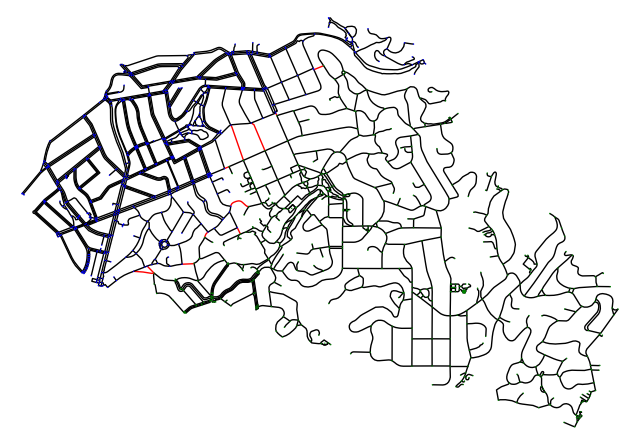

In [3]:
mes_modules.from_ox_to_coupe_valuee(Piedmont,2,0.1,2)

In [4]:
Piedmont = mes_modules.pretraitement(Piedmont)

In [5]:
print(nx.edge_betweenness_centrality(Piedmont))

{(0, 80, 0): 0.005253600375242227, (0, 788, 0): 0.005842443934734906, (1, 511, 0): 0.0009292517813216101, (1, 510, 0): 0.002669976664364905, (1, 969, 0): 0.0025604962641487547, (2, 3, 0): 0.0018307533482191094, (2, 719, 0): 0.0009383124591340403, (2, 995, 0): 0.0011801811241033164, (3, 2, 0): 0.0018879093205522411, (3, 998, 0): 0.0005695530282445563, (3, 974, 0): 0.0026601119223650035, (4, 974, 0): 0.006618300367352196, (4, 81, 0): 0.006251110626625321, (4, 587, 0): 0.011639294196979986, (5, 1207, 0): 0.0006111119217231457, (5, 1204, 0): 0.0005639323713895024, (5, 1199, 0): 0.0005756101867616225, (6, 509, 0): 0.0017883721192850908, (6, 297, 0): 0.005922209014755682, (6, 510, 0): 0.00514682823252183, (7, 655, 0): 0.003863856896516306, (7, 415, 0): 0.00608826977152811, (7, 8, 0): 0.005466079500091867, (8, 585, 0): 0.0008573286708785313, (8, 7, 0): 0.005218141875808449, (8, 388, 0): 0.004793366632140174, (9, 416, 0): 0.004494325451887761, (9, 7, 0): 0.004561251993954764, (9, 137, 0): 0.00

In [2]:
Batignolles = ox.graph_from_place("Batignolles", network_type = "drive", simplify = True)

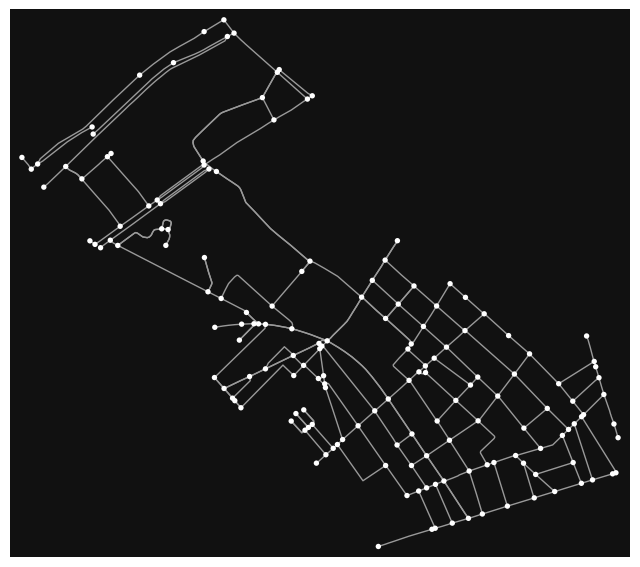

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [3]:
ox.plot_graph(Batignolles)

In [19]:
test = ox.load_graphml(filepath = "Paris_Paris_tol_4.graphml")

In [20]:
len(test)

40473

In [12]:
test = mes_modules.pretraitement(test)

In [21]:
x = 0
for c in nx.weakly_connected_components(test):
    print(len(c))
    x+=1
x

40293
3
10
6
2
3
11
2
2
4
2
6
40
22
8
4
3
3
11
2
2
4
6
2
3
4
2
2
2
1
1
1
1
1
1
1
1
1


38

In [16]:
largest_cc = max(nx.connected_components(test), key=len)

In [17]:
len(largest_cc)

40330

In [18]:
len(test)

40510

In [3]:
np.mean([0,2,5,7,9,12])

5.833333333333333

In [2]:
Paris = ox.load_graphml(filepath = 'Paris_Paris_tol_4.graphml')

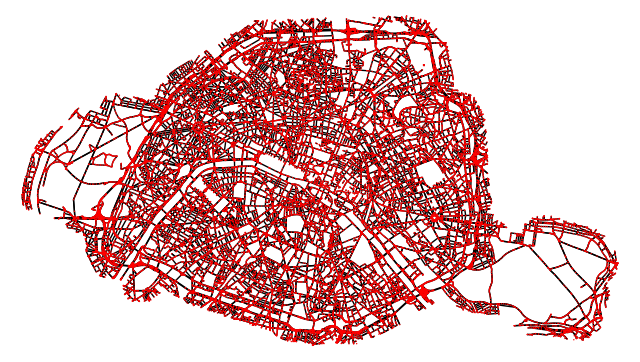

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [13]:
ox.plot_graph(Paris, node_size= 1, node_color = 'r', bgcolor = 'w',edge_color='black', save = True, dpi = 2160)

In [4]:
help(mes_modules)

Help on module mes_modules:

NAME
    mes_modules

FUNCTIONS
    add_extrapolated_width(G)
        # Fonction qui prend en argument un graphe et retourne une copie du graphe avec les width données par le modèle de régression linéaire
    
    add_fictive_node(G)
    
    add_node_weights_and_relabel(G)
        # Fonction qui ajoute les attributs poids aux nodes à un graphe osmnx et qui relabelle les noeuds de 0 à n
    
    add_nodes_and_edges_weights_and_relabel(G)
        # Fonction qui ajoute les attributs poids aux nodes et edges à un graphe osmnx et qui relabelle les noeuds de 0 à n
    
    aretes_coupees(xadj, adjcwgt, adjncy, comp_cnx)
        # Fonction qui, étant donnés un graphe kahip et la liste de ses composantes connexes après la coupe, retourne les arêtes coupées et le poids de la coupe
    
    betweenness_Paris()
    
    betweenness_Paris_tol_4()
    
    betweenness_Paris_tol_4_bis()
    
    clean_ox(G)
        # Prend en argument un graphe ox, relabelle les noeuds 

In [16]:
len(Paris)

58958

In [44]:
Paris = ox.load_graphml(filepath = 'Paris_Paris_tol_10.graphml')

In [45]:
len(Paris)

17609

In [46]:
len(Paris.edges)

29223

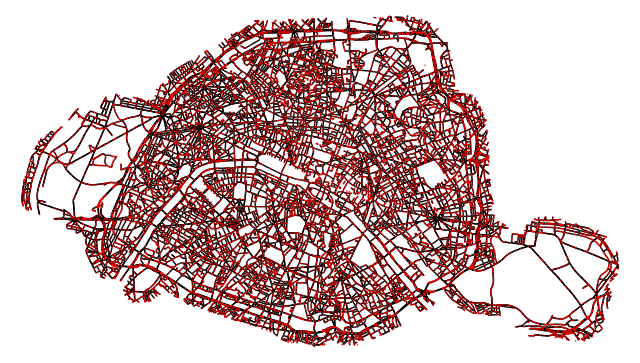

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [47]:
ox.plot_graph(Paris, node_size= 1, node_color = 'r', bgcolor = 'w',edge_color='black', save = True, dpi = 2160)

In [2]:
Paris_tol_10 = ox.load_graphml(filepath='Paris_Paris_tol_10.graphml')

In [3]:
Paris_tol_1 = ox.load_graphml(filepath='Paris_Paris_tol_1.graphml')

In [19]:
Paris_tol_4 = ox.load_graphml(filepath='Paris_Paris_tol_4.graphml')

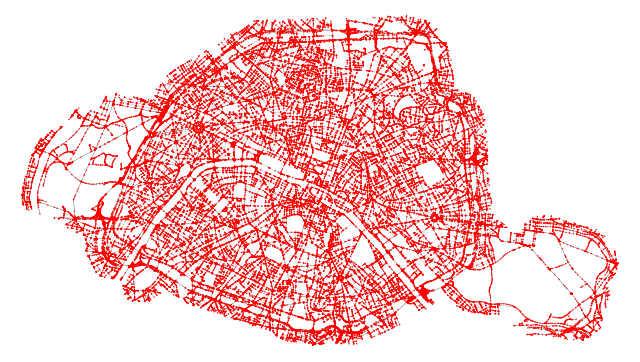

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [15]:
ox.plot_graph(Paris_tol_1,node_size= 1, node_color = 'r', bgcolor = 'w',edge_color='black', edge_linewidth = 0.1,save = True, dpi = 2160)

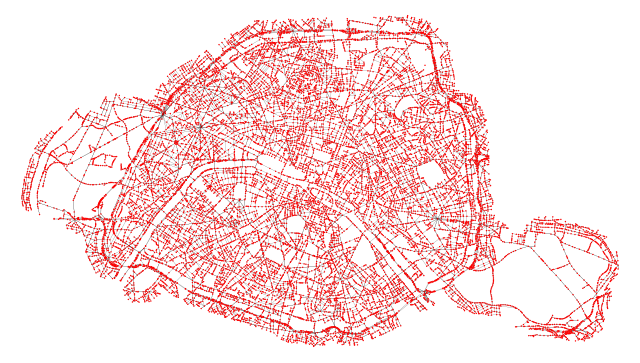

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [16]:
ox.plot_graph(Paris_tol_10,node_size= 1, node_color = 'r', bgcolor = 'w',edge_color='black', edge_linewidth = 0.1,save = True, dpi = 2160)

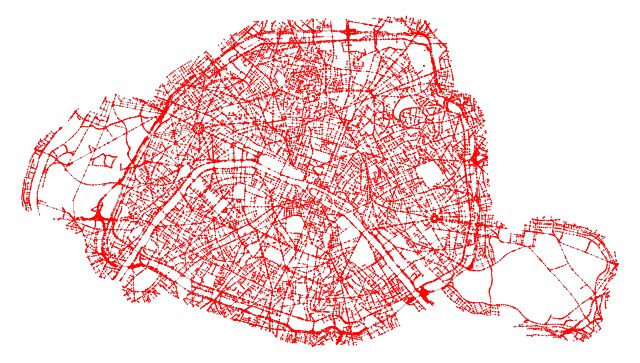

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [18]:
ox.plot_graph(Paris_tol_5,node_size= 1, node_color = 'r', bgcolor = 'w',edge_color='black', edge_linewidth = 0.1,save = True, dpi = 2160)

In [ ]:
mes_modules.from_ox_to_coupe_valuee_seed(Paris_tol_4,2,0.5,2,10)

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [20]:
help(mes_modules)

Help on module mes_modules:

NAME
    mes_modules

FUNCTIONS
    add_extrapolated_width(G)
        # Fonction qui prend en argument un graphe et retourne une copie du graphe avec les width données par le modèle de régression linéaire
    
    add_fictive_node(G)
    
    add_node_weights_and_relabel(G)
        # Fonction qui ajoute les attributs poids aux nodes à un graphe osmnx et qui relabelle les noeuds de 0 à n
    
    add_nodes_and_edges_weights_and_relabel(G)
        # Fonction qui ajoute les attributs poids aux nodes et edges à un graphe osmnx et qui relabelle les noeuds de 0 à n
    
    aretes_coupees(xadj, adjcwgt, adjncy, comp_cnx)
        # Fonction qui, étant donnés un graphe kahip et la liste de ses composantes connexes après la coupe, retourne les arêtes coupées et le poids de la coupe
    
    betweenness_Paris()
    
    betweenness_Paris_tol_4()
    
    betweenness_Paris_tol_4_bis()
    
    clean_ox(G)
        # Prend en argument un graphe ox, relabelle les noeuds 

In [27]:
Paris = ox.load_graphml(filepath='Paris_Paris_tol_4.graphml')

In [3]:
help(mes_modules)

Help on module mes_modules:

NAME
    mes_modules

FUNCTIONS
    add_extrapolated_width(G)
        # Fonction qui prend en argument un graphe et retourne une copie du graphe avec les width données par le modèle de régression linéaire
    
    add_fictive_node(G)
    
    add_node_weights_and_relabel(G)
        # Fonction qui ajoute les attributs poids aux nodes à un graphe osmnx et qui relabelle les noeuds de 0 à n
    
    add_nodes_and_edges_weights_and_relabel(G)
        # Fonction qui ajoute les attributs poids aux nodes et edges à un graphe osmnx et qui relabelle les noeuds de 0 à n
    
    aretes_coupees(xadj, adjcwgt, adjncy, comp_cnx)
        # Fonction qui, étant donnés un graphe kahip et la liste de ses composantes connexes après la coupe, retourne les arêtes coupées et le poids de la coupe
    
    betweenness_Paris()
    
    betweenness_Paris_tol_4()
    
    betweenness_Paris_tol_4_bis()
    
    clean_ox(G)
        # Prend en argument un graphe ox, relabelle les noeuds 

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


40510
46685.0
[(456, 458, 0), (461, 25046, 0), (463, 36734, 0), (467, 33644, 0), (529, 530, 0), (625, 20037, 0), (663, 39161, 0), (676, 29243, 0), (788, 789, 0), (832, 18939, 0), (1416, 1418, 0), (1419, 37551, 0), (1421, 1424, 0), (1793, 1794, 0), (2691, 27238, 0), (4432, 34513, 0), (4476, 4477, 0), (4486, 17396, 0), (5287, 5288, 0), (6018, 6019, 0), (6067, 27237, 0), (6121, 6122, 0), (6289, 6291, 0), (6319, 6328, 0), (6325, 6326, 0), (7995, 7996, 0), (8037, 34517, 0), (8059, 38278, 0), (8063, 8064, 0), (16182, 23154, 0), (16186, 16187, 0), (16190, 27744, 0), (18934, 29051, 0), (20657, 20658, 0), (27135, 27136, 0), (29893, 29927, 0), (32958, 32959, 0), (34892, 35016, 0)]
38
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

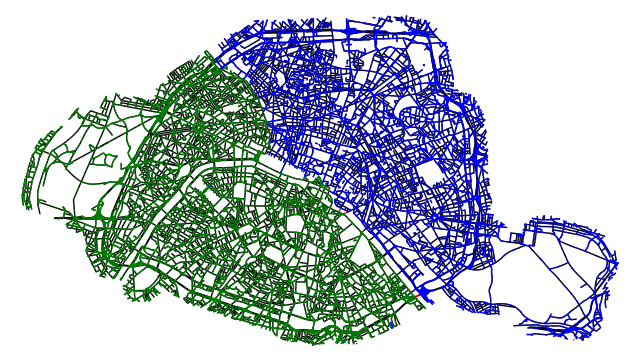

In [39]:
mes_modules.from_ox_to_coupe_valuee(Paris, 2,0.1,2)

In [14]:
Paris = mes_modules.add_nodes_and_edges_weights_and_relabel(Paris)

In [22]:
Paris = mes_modules.pretraitement_bis(Paris)

In [40]:
aretes_coupees = [(456, 458, 0), (461, 25046, 0), (463, 36734, 0), (467, 33644, 0), (529, 530, 0), (625, 20037, 0), (663, 39161, 0), (676, 29243, 0), (788, 789, 0), (832, 18939, 0), (1416, 1418, 0), (1419, 37551, 0), (1421, 1424, 0), (1793, 1794, 0), (2691, 27238, 0), (4432, 34513, 0), (4476, 4477, 0), (4486, 17396, 0), (5287, 5288, 0), (6018, 6019, 0), (6067, 27237, 0), (6121, 6122, 0), (6289, 6291, 0), (6319, 6328, 0), (6325, 6326, 0), (7995, 7996, 0), (8037, 34517, 0), (8059, 38278, 0), (8063, 8064, 0), (16182, 23154, 0), (16186, 16187, 0), (16190, 27744, 0), (18934, 29051, 0), (20657, 20658, 0), (27135, 27136, 0), (29893, 29927, 0), (32958, 32959, 0), (34892, 35016, 0)]

In [41]:
dict_mapping_type_lanes = mes_modules.mapping_type_lanes(Paris)   
            
mapping_edge_type = nx.get_edge_attributes(Paris, 'highway')

for edge in mapping_edge_type.keys():
    mapping_edge_type[edge] = mes_modules.list_to_premier_element(mapping_edge_type[edge])

mapping_edge_width = nx.get_edge_attributes(Paris, 'width')

for edge in mapping_edge_width.keys():
    mapping_edge_width[edge] = mes_modules.replace_list_with_max(mapping_edge_width[edge])

mapping_edge_lanes = nx.get_edge_attributes(Paris, 'lanes')

for edge in mapping_edge_lanes.keys():
    mapping_edge_lanes[edge] = mes_modules.replace_list_with_max(mapping_edge_lanes[edge])

for edge in Paris.edges:
    if edge not in mapping_edge_width.keys():
        if edge not in mapping_edge_lanes.keys():
            # Si on n'a ni le nb de voies, ni la largeur, on passe par le type de voie pour récupérer le nombre de voies
            mapping_edge_width[edge] = 5*dict_mapping_type_lanes[mapping_edge_type[edge]] #le facteur 5 est arbitraire
        else:
            mapping_edge_width[edge] = 5*mapping_edge_lanes[edge]

Paris_ = Paris.copy()

nx.set_edge_attributes(Paris_, mapping_edge_width,'width')

dict_weights = mapping_edge_width.copy()

nx.set_edge_attributes(Paris_,dict_weights,'weight')

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [42]:
tableau_weight = nx.get_edge_attributes(Paris_,'weight')

In [43]:
len(tableau_weight)

58958

In [44]:
sum_longueurs = 0
for arete in aretes_coupees:
    try:
        sum_longueurs += tableau_weight[arete]
    except:
        sum_longueurs += tableau_weight[(arete[1],arete[0],0)]

In [45]:
sum_longueurs

505.0

In [26]:
tableau_width

{(0, 1, 0): 1,
 (1, 34440, 0): 1,
 (34440, 18263, 0): 1,
 (2, 3, 0): 1,
 (2, 4, 0): 1,
 (2, 5, 0): 1,
 (2, 6, 0): 1,
 (3, 2648, 0): 1,
 (3, 2, 0): 1,
 (4, 2, 0): 1,
 (4, 18261, 0): 1,
 (5, 2, 0): 1,
 (5, 21785, 0): 1,
 (5, 21786, 0): 1,
 (6, 2, 0): 1,
 (6, 36185, 0): 1,
 (2648, 2647, 0): 1,
 (2648, 3, 0): 1,
 (18261, 4, 0): 1,
 (18261, 18259, 0): 1,
 (21785, 26289, 0): 1,
 (21785, 5, 0): 1,
 (21785, 26290, 0): 1,
 (21786, 5, 0): 1,
 (21786, 26291, 0): 1,
 (36185, 28887, 0): 1,
 (36185, 6, 0): 1,
 (7, 10686, 0): 1,
 (10686, 10687, 0): 1,
 (8, 9, 0): 1,
 (9, 10688, 0): 1,
 (10688, 10689, 0): 1,
 (10, 11, 0): 1,
 (10, 12, 0): 1,
 (10, 17089, 0): 1,
 (11, 10384, 0): 1,
 (12, 10, 0): 1,
 (12, 38185, 0): 1,
 (17089, 17088, 0): 1,
 (17089, 10, 0): 1,
 (10384, 14982, 0): 1,
 (10384, 18187, 0): 1,
 (38185, 12, 0): 1,
 (38185, 38184, 0): 1,
 (13, 14, 0): 1,
 (14, 10635, 0): 1,
 (10635, 10636, 0): 1,
 (15, 16, 0): 1,
 (16, 30618, 0): 1,
 (30618, 13, 0): 1,
 (17, 18, 0): 1,
 (17, 24976, 0): 1,
 (1

In [48]:
Paris = ox.load_graphml(filepath='Paris_Paris_tol_4.graphml')

In [49]:
help(mes_modules)

Help on module mes_modules:

NAME
    mes_modules

FUNCTIONS
    add_extrapolated_width(G)
        # Fonction qui prend en argument un graphe et retourne une copie du graphe avec les width données par le modèle de régression linéaire
    
    add_fictive_node(G)
    
    add_node_weights_and_relabel(G)
        # Fonction qui ajoute les attributs poids aux nodes à un graphe osmnx et qui relabelle les noeuds de 0 à n
    
    add_nodes_and_edges_weights_and_relabel(G)
        # Fonction qui ajoute les attributs poids aux nodes et edges à un graphe osmnx et qui relabelle les noeuds de 0 à n
    
    aretes_coupees(xadj, adjcwgt, adjncy, comp_cnx)
        # Fonction qui, étant donnés un graphe kahip et la liste de ses composantes connexes après la coupe, retourne les arêtes coupées et le poids de la coupe
    
    betweenness_Paris()
    
    betweenness_Paris_tol_4()
    
    betweenness_Paris_tol_4_bis()
    
    clean_ox(G)
        # Prend en argument un graphe ox, relabelle les noeuds 

/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/baroa/.conda/envs/env_py/lib/python3.8/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


40510
46685.0
[(456, 458, 0), (461, 25046, 0), (463, 36734, 0), (467, 33644, 0), (529, 530, 0), (625, 20037, 0), (663, 39161, 0), (676, 29243, 0), (788, 789, 0), (832, 18939, 0), (1416, 1418, 0), (1419, 37551, 0), (1421, 1424, 0), (1793, 1794, 0), (2691, 27238, 0), (4432, 34513, 0), (4476, 4477, 0), (4486, 17396, 0), (5287, 5288, 0), (6018, 6019, 0), (6067, 27237, 0), (6121, 6122, 0), (6289, 6291, 0), (6319, 6328, 0), (6325, 6326, 0), (7995, 7996, 0), (8037, 34517, 0), (8059, 38278, 0), (8063, 8064, 0), (16182, 23154, 0), (16186, 16187, 0), (16190, 27744, 0), (18934, 29051, 0), (20657, 20658, 0), (27135, 27136, 0), (29893, 29927, 0), (32958, 32959, 0), (34892, 35016, 0)]
38
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

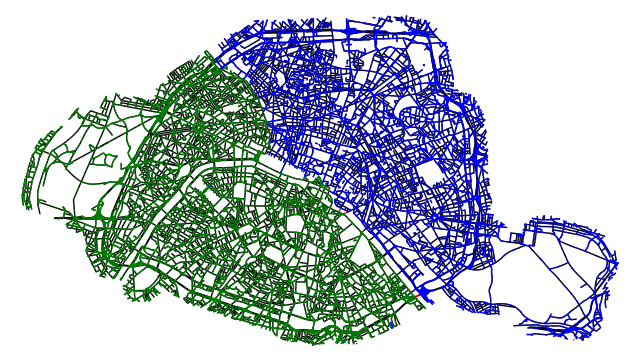

In [50]:
mes_modules.from_ox_to_coupe_valuee(Paris,2,0.1,2)

In [52]:
G = ox.graph_from_place('Paris', network_type="drive",simplify=True)

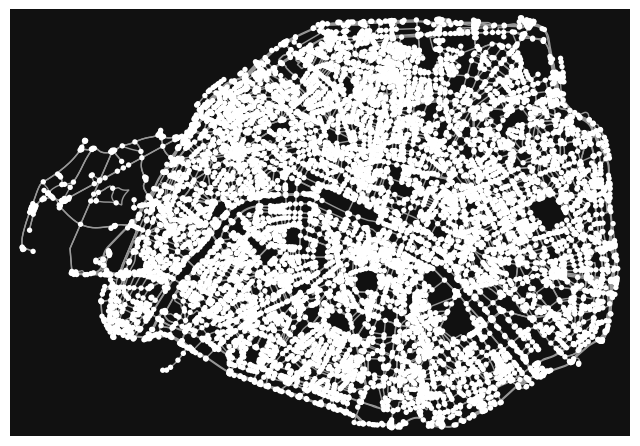

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [53]:
ox.plot_graph(G)

In [54]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

In [55]:
gdf_nodes

,y,x,street_count,highway,ref,geometry
osmid,,,,,,
125730,48.863523,2.410732,4,NaN,NaN,POINT (2.41073 48.86352)
125742,48.851852,2.401373,4,NaN,NaN,POINT (2.40137 48.85185)
125743,48.854563,2.413409,3,NaN,NaN,POINT (2.41341 48.85456)
125745,48.854524,2.414352,3,NaN,NaN,POINT (2.41435 48.85452)
125747,48.854261,2.414664,3,NaN,NaN,POINT (2.41466 48.85426)
...,...,...,...,...,...,...
11554041564,48.852360,2.280192,3,NaN,NaN,POINT (2.28019 48.85236)
11561249900,48.841289,2.407159,1,NaN,NaN,POINT (2.40716 48.84129)
11563663280,48.871714,2.341603,3,NaN,NaN,POINT (2.34160 48.87171)


In [56]:
gdf_edges

osmid                  name  \
u           v          key                                                 
125730      268675130  0                 315818975   Rue Henri Duvernois   
            21112878   0                  31093720     Rue Louis Lumière   
            244455548  0                  85735969     Rue Louis Lumière   
            1089076182 0    [266463585, 611974677]       Rue Louis Ganne   
125742      60912980   0                   4039102       Rue de Buzenval   
...                                            ...                   ...   
11561249900 246020408  0                  22882395  Rue de Rambervillers   
11563663280 8107850868 0                  18229612  Boulevard Montmartre   
            25207313   0                  18229612  Boulevard Montmartre   
11571543947 703722649  0                  56066101  Rue Dieudonné Costes   
11616256732 203319696  0                  54035372      Rue des Marchais   

                                 highway maxspeed  oneway reversed   length  \
u           v          key                                                    
125730      268675130  0     residential       30   False     True    8.707   
            21112878   0     residential       30   False    False  142.215   
            244455548  0     residential       30   False     True  105.925   
            1089076182 0     residential       30   False     True  128.653   
125742      60912980   0     residential       30    True    False  129.019   
...                                  ...      ...     ...      ...      ...   
11561249900 246020408  0     residential       30   False    False   99.930   
11563663280 8107850868 0         primary       30   False    False   89.993   
            25207313   0         primary       30   False     True  110.251   
11571543947 703722649  0    unclassified      NaN   False     True  161.373   
11616256732 203319696  0     residential       30   False     True   82.894   

                           lanes  \
u           v          key         
125730      268675130  0     NaN   
            21112878   0       2   
            244455548  0       2   
            1089076182 0       2   
125742      60912980   0     NaN   
...                          ...   
11561249900 246020408  0     NaN   
11563663280 8107850868 0       3   
            25207313   0       3   
11571543947 703722649  0     NaN   
11616256732 203319696  0     NaN   

                                                                     geometry  \
u           v          key                                                      
125730      268675130  0      LINESTRING (2.41073 48.86352, 2.41083 48.86348)   
            21112878   0    LINESTRING (2.41073 48.86352, 2.41046 48.86425...   
            244455548  0    LINESTRING (2.41073 48.86352, 2.41077 48.86337...   
            1089076182 0    LINESTRING (2.41073 48.86352, 2.41061 48.86351...   
125742      60912980   0    LINESTRING (2.40137 48.85185, 2.40133 48.85192...   
...                                                                       ...   
11561249900 246020408  0    LINESTRING (2.40716 48.84129, 2.40715 48.84132...   
11563663280 8107850868 0      LINESTRING (2.34160 48.87171, 2.34041 48.87191)   
            25207313   0    LINESTRING (2.34160 48.87171, 2.34187 48.87167...   
11571543947 703722649  0    LINESTRING (2.36886 48.82036, 2.36886 48.82028...   
11616256732 203319696  0    LINESTRING (2.39937 48.88345, 2.39864 48.88382...   

                           junction width bridge tunnel access  ref  
u           v          key                                           
125730      268675130  0        NaN   NaN    NaN    NaN    NaN  NaN  
            21112878   0        NaN   NaN    NaN    NaN    NaN  NaN  
            244455548  0        NaN   NaN    NaN    NaN    NaN  NaN  
            1089076182 0        NaN   NaN    NaN    NaN    NaN  NaN  
125742      60912980   0        NaN   NaN    NaN    NaN    NaN  NaN  
...            